In [1]:

from pathlib import Path
import pandas as pd

DATASETS_ROOT = Path("Datasets")  # change if your folder name/path differs

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

def count_images_in_dir(root: Path):
    """Count images under class folders (and any nested files)."""
    if not root.exists():
        return None, {}
    per_class = {}
    total = 0
    # class folders = immediate subdirs
    class_dirs = sorted([p for p in root.iterdir() if p.is_dir()])
    if not class_dirs:
        # maybe images directly under root
        n = sum(1 for p in root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS)
        return n, {"(root)": n}
    for cdir in class_dirs:
        n = sum(1 for p in cdir.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS)
        per_class[cdir.name] = n
        total += n
    return total, per_class

rows = []
print(f"Root: {DATASETS_ROOT.resolve()}\n")

for name in DATASET_NAMES:
    dpath = DATASETS_ROOT / name
    total, per_class = count_images_in_dir(dpath)
    if total is None:
        print(f"[MISSING] {dpath}")
        rows.append({"dataset": name, "n_classes": 0, "n_images": 0, "status": "missing"})
        continue
    print(f"=== {name} ===")
    print(f"path: {dpath}")
    print(f"classes ({len(per_class)}): {list(per_class.keys())}")
    for c, n in per_class.items():
        print(f"  {c:20s} {n}")
    print(f"TOTAL images: {total}\n")
    rows.append({
        "dataset": name,
        "n_classes": len(per_class),
        "n_images": total,
        "status": "ok",
        **{f"cls_{k}": v for k, v in per_class.items()},
    })

df = pd.DataFrame(rows)
print("=" * 60)
print(df[["dataset", "n_classes", "n_images", "status"]].to_string(index=False))
print("=" * 60)
print("Grand total (all found datasets):", int(df.loc[df["status"]=="ok", "n_images"].sum()))
print("Min n_images (limits balanced sample):", int(df.loc[df["status"]=="ok", "n_images"].min()) if (df["status"]=="ok").any() else None)

Root: /home/Datasets

=== iNaturalist_Research_Data ===
path: Datasets/iNaturalist_Research_Data
classes (7): ['Araneae', 'Coleoptera', 'Diptera', 'Hemiptera', 'Hymenoptera', 'Lepidoptera', 'Odonata']
  Araneae              999
  Coleoptera           998
  Diptera              995
  Hemiptera            999
  Hymenoptera          994
  Lepidoptera          998
  Odonata              1000
TOTAL images: 6983

=== iNaturalist_Regular_Data ===
path: Datasets/iNaturalist_Regular_Data
classes (7): ['Araneae', 'Coleoptera', 'Diptera', 'Hemiptera', 'Hymenoptera', 'Lepidoptera', 'Odonata']
  Araneae              991
  Coleoptera           981
  Diptera              984
  Hemiptera            977
  Hymenoptera          987
  Lepidoptera          962
  Odonata              919
TOTAL images: 6801

=== ArTaxOr ===
path: Datasets/ArTaxOr
classes (7): ['Araneae', 'Coleoptera', 'Diptera', 'Hemiptera', 'Hymenoptera', 'Lepidoptera', 'Odonata']
  Araneae              2302
  Coleoptera           2037
  Di

In [2]:
# Build dataset_classification splits: 4000 train / 600 val / 600 test per dataset
# Guarantees unique images across train/val/test (disjoint by absolute path)
from pathlib import Path
import random
import shutil
import pandas as pd

SEED = 42
random.seed(SEED)

DATASETS_ROOT = Path("Datasets")
OUT_ROOT = Path("dataset_classification")  # new folder

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]

N_TRAIN, N_VAL, N_TEST = 4000, 600, 600
N_NEED = N_TRAIN + N_VAL + N_TEST  # 5200
assert N_NEED <= 5261, "Insects has only 5261 images"

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

def list_images(dataset_dir: Path):
    files = [
        p for p in dataset_dir.rglob("*")
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    ]
    # unique by resolved path
    uniq = {p.resolve(): p for p in files}
    return list(uniq.values())

def copy_split(files, dest_dir: Path):
    dest_dir.mkdir(parents=True, exist_ok=True)
    rows = []
    for src in files:
        # flat copy with unique name to avoid collisions across class folders
        dst_name = f"{src.parent.name}__{src.name}"
        dst = dest_dir / dst_name
        # if collision, add a counter
        k = 1
        while dst.exists():
            dst = dest_dir / f"{src.parent.name}__{k}_{src.name}"
            k += 1
        shutil.copy2(src, dst)
        rows.append({"src": str(src.resolve()), "dst": str(dst.resolve())})
    return rows

# wipe/recreate output
if OUT_ROOT.exists():
    shutil.rmtree(OUT_ROOT)
for split in ("train", "val", "test"):
    for name in DATASET_NAMES:
        (OUT_ROOT / split / name).mkdir(parents=True, exist_ok=True)

all_manifest = []
summary = []

for name in DATASET_NAMES:
    src_root = DATASETS_ROOT / name
    imgs = list_images(src_root)
    assert len(imgs) >= N_NEED, f"{name}: have {len(imgs)}, need {N_NEED}"

    random.shuffle(imgs)
    train_files = imgs[:N_TRAIN]
    val_files = imgs[N_TRAIN:N_TRAIN + N_VAL]
    test_files = imgs[N_TRAIN + N_VAL:N_TRAIN + N_VAL + N_TEST]

    # uniqueness checks (within dataset)
    paths = [p.resolve() for p in train_files + val_files + test_files]
    assert len(paths) == len(set(paths)), f"{name}: duplicate paths across splits!"
    assert set(train_files).isdisjoint(val_files)
    assert set(train_files).isdisjoint(test_files)
    assert set(val_files).isdisjoint(test_files)

    for split, files in [("train", train_files), ("val", val_files), ("test", test_files)]:
        rows = copy_split(files, OUT_ROOT / split / name)
        for r in rows:
            r.update({"dataset": name, "split": split})
            all_manifest.append(r)

    summary.append({
        "dataset": name,
        "available": len(imgs),
        "train": len(train_files),
        "val": len(val_files),
        "test": len(test_files),
        "unused": len(imgs) - N_NEED,
    })
    print(f"{name}: train={len(train_files)} val={len(val_files)} test={len(test_files)} unused={len(imgs)-N_NEED}")

# global uniqueness across entire build
manifest_df = pd.DataFrame(all_manifest)
assert manifest_df["src"].is_unique, "ERROR: same source image used more than once"
assert len(manifest_df) == 4 * N_NEED

# final counts
print("\n=== per split × dataset ===")
for split in ("train", "val", "test"):
    for name in DATASET_NAMES:
        n = len(list((OUT_ROOT / split / name).glob("*")))
        print(f"  {split}/{name}: {n}")

summary_df = pd.DataFrame(summary)
print("\n", summary_df.to_string(index=False))
print(f"\nTotal images written: {len(manifest_df)}")
print(f"Chance-level baseline later: 25% (4-way)")

OUT_ROOT.mkdir(parents=True, exist_ok=True)
manifest_path = OUT_ROOT / "split_manifest.csv"
summary_path = OUT_ROOT / "split_summary.csv"
manifest_df.to_csv(manifest_path, index=False)
summary_df.to_csv(summary_path, index=False)
print("Saved:", manifest_path.resolve())
print("Saved:", summary_path.resolve())
print("Output root:", OUT_ROOT.resolve())

iNaturalist_Research_Data: train=4000 val=600 test=600 unused=1783
iNaturalist_Regular_Data: train=4000 val=600 test=600 unused=1601
ArTaxOr: train=4000 val=600 test=600 unused=9635
Insects_Image_Dataset: train=4000 val=600 test=600 unused=61

=== per split × dataset ===
  train/iNaturalist_Research_Data: 4000
  train/iNaturalist_Regular_Data: 4000
  train/ArTaxOr: 4000
  train/Insects_Image_Dataset: 4000
  val/iNaturalist_Research_Data: 600
  val/iNaturalist_Regular_Data: 600
  val/ArTaxOr: 600
  val/Insects_Image_Dataset: 600
  test/iNaturalist_Research_Data: 600
  test/iNaturalist_Regular_Data: 600
  test/ArTaxOr: 600
  test/Insects_Image_Dataset: 600

                   dataset  available  train  val  test  unused
iNaturalist_Research_Data       6983   4000  600   600    1783
 iNaturalist_Regular_Data       6801   4000  600   600    1601
                  ArTaxOr      14835   4000  600   600    9635
    Insects_Image_Dataset       5261   4000  600   600      61

Total images writte

In [3]:
# Verify counts in dataset_classification output
from pathlib import Path
import pandas as pd

OUT_ROOT = Path("dataset_classification")
DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rows = []
print(f"Root: {OUT_ROOT.resolve()}\n")

for split in ("train", "val", "test"):
    for name in DATASET_NAMES:
        d = OUT_ROOT / split / name
        if not d.exists():
            print(f"[MISSING] {d}")
            rows.append({"split": split, "dataset": name, "n_images": 0, "status": "missing"})
            continue
        n = sum(1 for p in d.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS)
        rows.append({"split": split, "dataset": name, "n_images": n, "status": "ok"})
        print(f"{split:5s} / {name:28s} {n}")

df = pd.DataFrame(rows)
print("\n=== pivot (rows=dataset, cols=split) ===")
pivot = df.pivot(index="dataset", columns="split", values="n_images")
# nice column order
pivot = pivot.reindex(columns=["train", "val", "test"])
print(pivot.to_string())
print("\nPer-split totals:", pivot.sum().to_dict())
print("Grand total:", int(df["n_images"].sum()))

# expected checks
expected = {"train": 4000, "val": 600, "test": 600}
ok = True
for split, exp in expected.items():
    bad = pivot[split][pivot[split] != exp]
    if len(bad):
        ok = False
        print(f"WARNING {split}: expected {exp} each, got:\n{bad}")
if ok:
    print("\nOK: every dataset has exactly 4000 / 600 / 600")

Root: /home/dataset_classification

train / iNaturalist_Research_Data    4000
train / iNaturalist_Regular_Data     4000
train / ArTaxOr                      4000
train / Insects_Image_Dataset        4000
val   / iNaturalist_Research_Data    600
val   / iNaturalist_Regular_Data     600
val   / ArTaxOr                      600
val   / Insects_Image_Dataset        600
test  / iNaturalist_Research_Data    600
test  / iNaturalist_Regular_Data     600
test  / ArTaxOr                      600
test  / Insects_Image_Dataset        600

=== pivot (rows=dataset, cols=split) ===
split                      train  val  test
dataset                                    
ArTaxOr                     4000  600   600
Insects_Image_Dataset       4000  600   600
iNaturalist_Regular_Data    4000  600   600
iNaturalist_Research_Data   4000  600   600

Per-split totals: {'train': 16000, 'val': 2400, 'test': 2400}
Grand total: 20800

OK: every dataset has exactly 4000 / 600 / 600


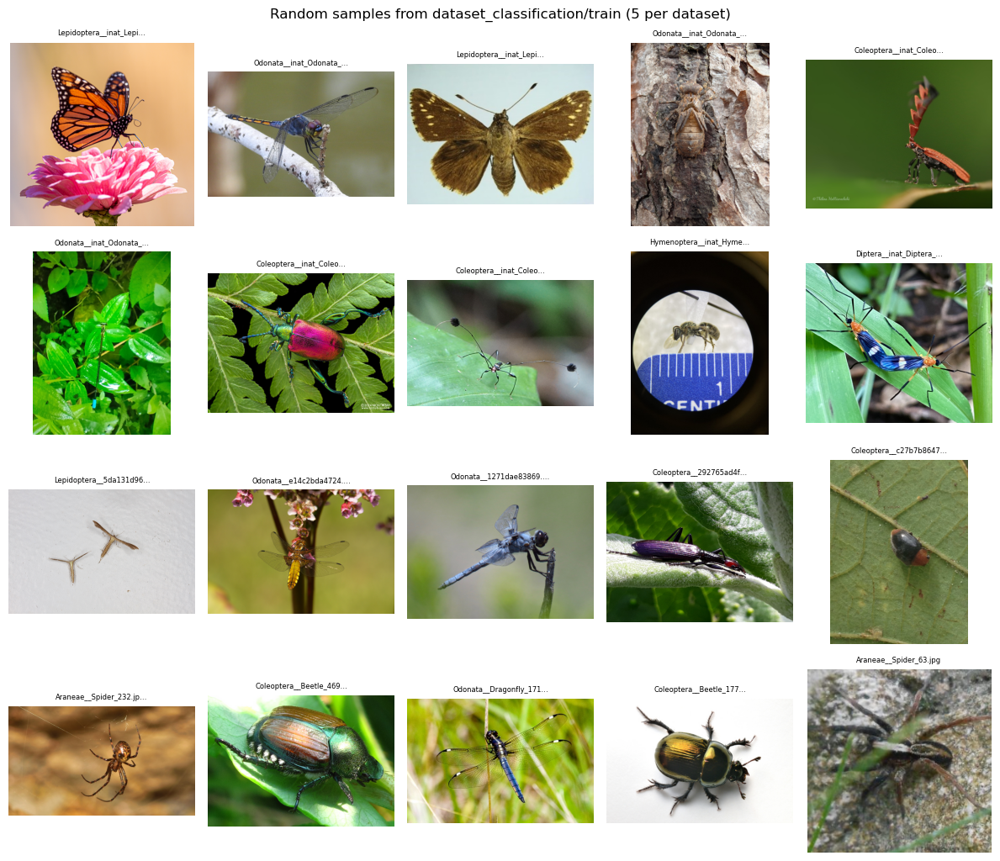

Saved: /home/resulted matrix/dataset_cls_samples_train.pdf


In [4]:
# Visualize 5 random samples per dataset (from train split)
from pathlib import Path
import random
import matplotlib.pyplot as plt
from PIL import Image

OUT_ROOT = Path("dataset_classification")
SPLIT = "train"  # change to "val" / "test" if you want
N_SHOW = 5
SEED = 42

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rng = random.Random(SEED)

fig, axes = plt.subplots(len(DATASET_NAMES), N_SHOW, figsize=(2.4 * N_SHOW, 2.6 * len(DATASET_NAMES)))

for i, name in enumerate(DATASET_NAMES):
    folder = OUT_ROOT / SPLIT / name
    files = [p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS]
    assert len(files) >= N_SHOW, f"Not enough images in {folder}"
    picks = rng.sample(files, N_SHOW)

    for j, fp in enumerate(picks):
        ax = axes[i, j]
        img = Image.open(fp).convert("RGB")
        ax.imshow(img)
        ax.axis("off")
        if j == 0:
            ax.set_ylabel(name.replace("_", "\n"), fontsize=8, rotation=0, labelpad=40, va="center")
        ax.set_title(fp.name[:22] + ("…" if len(fp.name) > 22 else ""), fontsize=6)

fig.suptitle(f"Random samples from dataset_classification/{SPLIT} (5 per dataset)", fontsize=12)
plt.tight_layout()
out_pdf = Path("resulted matrix")
out_pdf.mkdir(parents=True, exist_ok=True)
save_path = out_pdf / f"dataset_cls_samples_{SPLIT}.pdf"
fig.savefig(save_path, bbox_inches="tight")
plt.show()
print("Saved:", save_path.resolve())

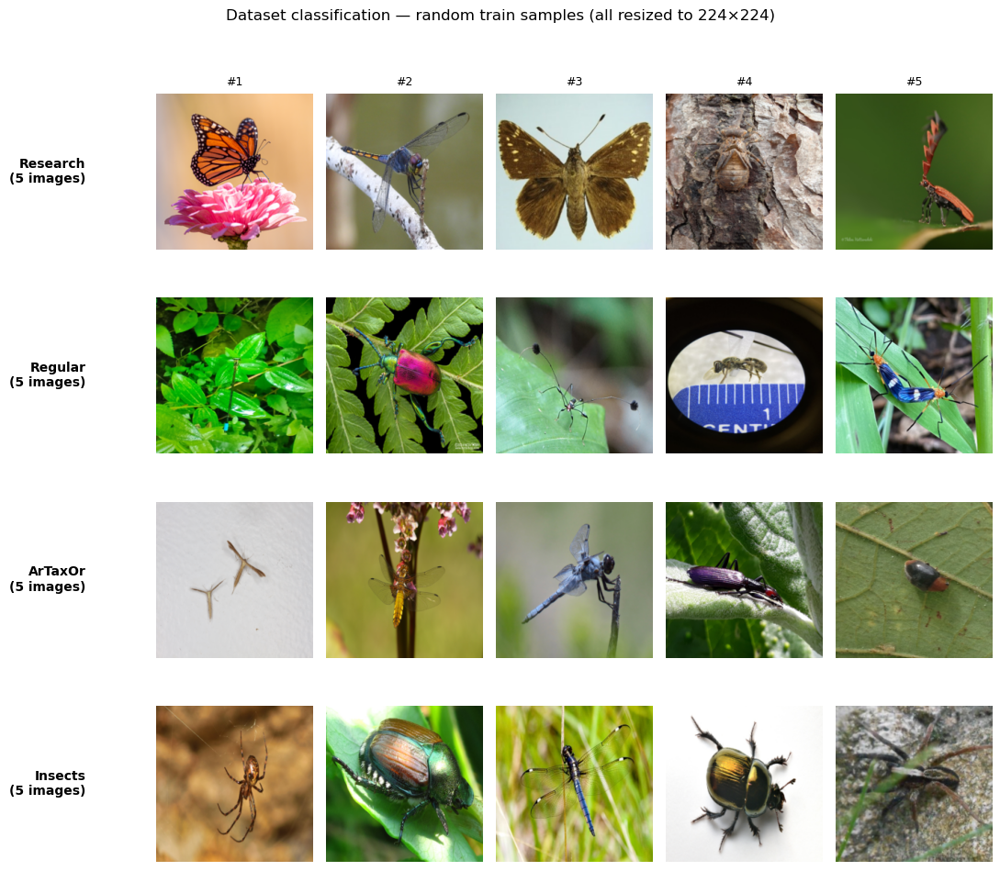

Saved: /home/resulted matrix/dataset_cls_samples_train_labeled.pdf


In [6]:
# Visualize 5 random samples per dataset (equal size + clear labels)
from pathlib import Path
import random
import matplotlib.pyplot as plt
from PIL import Image

OUT_ROOT = Path("dataset_classification")
SPLIT = "train"
N_SHOW = 5
SEED = 42
THUMB = (224, 224)  # all panels same size

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
DISPLAY_NAMES = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rng = random.Random(SEED)
fig, axes = plt.subplots(
    len(DATASET_NAMES), N_SHOW,
    figsize=(2.2 * N_SHOW, 2.4 * len(DATASET_NAMES)),
)

for i, name in enumerate(DATASET_NAMES):
    folder = OUT_ROOT / SPLIT / name
    files = [p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS]
    assert len(files) >= N_SHOW, f"Not enough images in {folder}"
    picks = rng.sample(files, N_SHOW)
    label = DISPLAY_NAMES[name]

    for j, fp in enumerate(picks):
        ax = axes[i, j]
        img = Image.open(fp).convert("RGB").resize(THUMB, Image.Resampling.BILINEAR)
        ax.imshow(img)
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

        if j == 0:
            ax.set_ylabel(f"{label}\n(5 images)", fontsize=10, fontweight="bold",
                          rotation=0, labelpad=55, va="center", ha="right")
        if i == 0:
            ax.set_title(f"#{j+1}", fontsize=9)

fig.suptitle(
    f"Dataset classification — random {SPLIT} samples (all resized to {THUMB[0]}×{THUMB[1]})",
    fontsize=12, y=1.01,
)
plt.tight_layout()

out_dir = Path("resulted matrix")
out_dir.mkdir(parents=True, exist_ok=True)
save_path = out_dir / f"dataset_cls_samples_{SPLIT}_labeled.pdf"
fig.savefig(save_path, bbox_inches="tight")
plt.show()
print("Saved:", save_path.resolve())

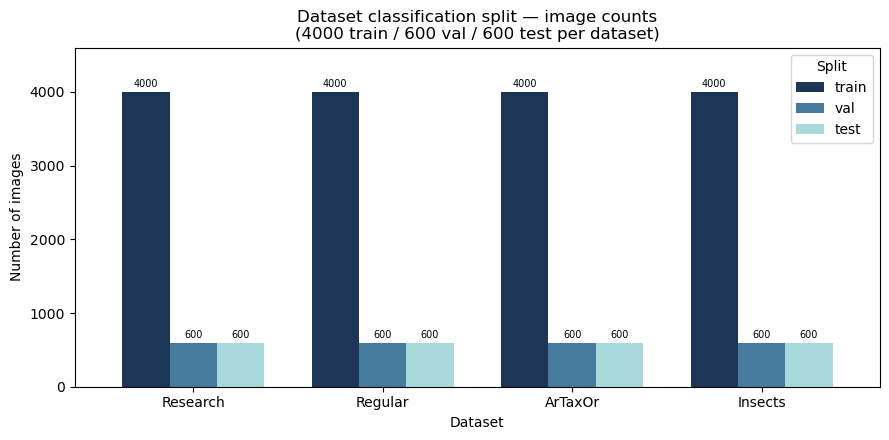

split          train  val  test
dataset_short                  
Research        4000  600   600
Regular         4000  600   600
ArTaxOr         4000  600   600
Insects         4000  600   600
Saved: /home/resulted matrix/dataset_cls_image_count_histogram.pdf


In [5]:
# Histogram / bar chart of image counts in dataset_classification
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

OUT_ROOT = Path("dataset_classification")
FIG_DIR = Path("resulted matrix")
FIG_DIR.mkdir(parents=True, exist_ok=True)

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rows = []
for split in ("train", "val", "test"):
    for name in DATASET_NAMES:
        d = OUT_ROOT / split / name
        n = sum(1 for p in d.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS) if d.exists() else 0
        rows.append({"split": split, "dataset": name, "n_images": n})

df = pd.DataFrame(rows)
short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
df["dataset_short"] = df["dataset"].map(short)

# grouped bar chart
pivot = df.pivot(index="dataset_short", columns="split", values="n_images")
pivot = pivot.reindex(index=["Research", "Regular", "ArTaxOr", "Insects"],
                      columns=["train", "val", "test"])

ax = pivot.plot(kind="bar", figsize=(9, 4.5), width=0.75,
                color=["#1d3557", "#457b9d", "#a8dadc"])
ax.set_ylabel("Number of images")
ax.set_xlabel("Dataset")
ax.set_title("Dataset classification split — image counts\n(4000 train / 600 val / 600 test per dataset)")
ax.legend(title="Split")
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
for c in ax.containers:
    ax.bar_label(c, fmt="%d", fontsize=7, padding=2)
ax.set_ylim(0, pivot.values.max() * 1.15)
plt.tight_layout()

out_pdf = FIG_DIR / "dataset_cls_image_count_histogram.pdf"
plt.savefig(out_pdf, bbox_inches="tight")
plt.show()
print(pivot.to_string())
print("Saved:", out_pdf.resolve())

In [2]:
import warnings
from dataclasses import dataclass, field
from pathlib import Path
from typing import List
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import CSVLogger
from torchmetrics.classification import MulticlassAccuracy

warnings.filterwarnings("ignore")

SEED = 42
pl.seed_everything(SEED, workers=True)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

ACCELERATOR = "gpu" if torch.cuda.is_available() else "cpu"
DEVICES = 1
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(torch.__version__, ACCELERATOR, DEVICE)

Seed set to 42


2.5.1 gpu cuda


In [3]:
@dataclass
class Config:
    data_root: Path = Path("dataset_classification")
    class_names: List[str] = field(default_factory=lambda: [
        "ArTaxOr",
        "Insects_Image_Dataset",
        "iNaturalist_Regular_Data",
        "iNaturalist_Research_Data",
    ])  # ImageFolder sorts alphabetically — must match that order
    image_size: int = 224
    batch_size: int = 32
    num_workers: int = 4

    # locked HP from insect-order winner
    lr: float = 5e-5
    weight_decay: float = 1e-3
    dropout_p: float = 0.3
    label_smoothing: float = 0.0

    max_epochs: int = 100
    early_stop_patience: int = 12
    early_stop_min_delta: float = 1e-3
    monitor_metric: str = "val_loss"
    monitor_mode: str = "min"

    ckpt_dir: str = "checkpoints_dataset_cls_4way"
    log_dir: str = "lightning_logs_dataset_cls_4way"
    fig_dir: str = "resulted matrix"
    run_name: str = "e2e_locked_lr5e5"
    seed: int = SEED

    @property
    def num_classes(self) -> int:
        return len(self.class_names)

cfg = Config()
Path(cfg.ckpt_dir).mkdir(parents=True, exist_ok=True)
Path(cfg.fig_dir).mkdir(parents=True, exist_ok=True)
print("4-way dataset classification | chance = 25%")
print("classes:", cfg.class_names)
print(f"HP: lr={cfg.lr}, wd={cfg.weight_decay}, dropout={cfg.dropout_p}")

4-way dataset classification | chance = 25%
classes: ['ArTaxOr', 'Insects_Image_Dataset', 'iNaturalist_Regular_Data', 'iNaturalist_Research_Data']
HP: lr=5e-05, wd=0.001, dropout=0.3


In [4]:
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

train_tfms = transforms.Compose([
    transforms.Resize((cfg.image_size + 32, cfg.image_size + 32)),
    transforms.RandomCrop(cfg.image_size),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])
eval_tfms = transforms.Compose([
    transforms.Resize((cfg.image_size, cfg.image_size)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

train_ds = ImageFolder(str(cfg.data_root / "train"), transform=train_tfms)
val_ds   = ImageFolder(str(cfg.data_root / "val"),   transform=eval_tfms)
test_ds  = ImageFolder(str(cfg.data_root / "test"),  transform=eval_tfms)

print("ImageFolder classes:", train_ds.classes)
assert train_ds.classes == cfg.class_names, (train_ds.classes, cfg.class_names)
assert val_ds.classes == cfg.class_names and test_ds.classes == cfg.class_names

loader_kw = dict(
    batch_size=cfg.batch_size,
    num_workers=cfg.num_workers,
    pin_memory=torch.cuda.is_available(),
    persistent_workers=cfg.num_workers > 0,
)
train_loader = DataLoader(train_ds, shuffle=True, **loader_kw)
val_loader   = DataLoader(val_ds, shuffle=False, **loader_kw)
test_loader  = DataLoader(test_ds, shuffle=False, **loader_kw)
print(len(train_ds), len(val_ds), len(test_ds))  # expect 16000, 2400, 2400

ImageFolder classes: ['ArTaxOr', 'Insects_Image_Dataset', 'iNaturalist_Regular_Data', 'iNaturalist_Research_Data']
16000 2400 2401


In [5]:
class DatasetClassifierConvNeXt(pl.LightningModule):
    """4-way dataset-ID classifier """
    def __init__(self, cfg: Config):
        super().__init__()
        self.cfg = cfg
        self.save_hyperparameters(ignore=["cfg"])

        weights = torchvision.models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = torchvision.models.convnext_tiny(weights=weights)
        in_features = self.backbone.classifier[2].in_features
        self.backbone.classifier = nn.Sequential(
            self.backbone.classifier[0],
            self.backbone.classifier[1],
            nn.Dropout(p=cfg.dropout_p),
            nn.Linear(in_features, cfg.num_classes),
        )
        for p in self.parameters():
            p.requires_grad = True

        self.criterion = nn.CrossEntropyLoss(label_smoothing=cfg.label_smoothing)
        self.train_acc = MulticlassAccuracy(num_classes=cfg.num_classes)
        self.val_acc = MulticlassAccuracy(num_classes=cfg.num_classes)
        self.test_acc = MulticlassAccuracy(num_classes=cfg.num_classes)

    def forward(self, x):
        return self.backbone(x)

    def _shared(self, batch, stage: str):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        if stage == "train":
            self.train_acc.update(preds, y)
            self.log("train_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
            self.log("train_acc", self.train_acc, on_step=False, on_epoch=True, prog_bar=True)
        elif stage == "val":
            self.val_acc.update(preds, y)
            self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
            self.log("val_acc", self.val_acc, on_step=False, on_epoch=True, prog_bar=True)
        else:
            self.test_acc.update(preds, y)
            self.log("test_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
            self.log("test_acc", self.test_acc, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def training_step(self, batch, batch_idx):
        return self._shared(batch, "train")

    def validation_step(self, batch, batch_idx):
        return self._shared(batch, "val")

    def test_step(self, batch, batch_idx):
        return self._shared(batch, "test")

    def configure_optimizers(self):
        opt = torch.optim.AdamW(self.parameters(), lr=self.cfg.lr, weight_decay=self.cfg.weight_decay)
        sch = torch.optim.lr_scheduler.ReduceLROnPlateau(
            opt, mode="min", factor=0.5, patience=2, min_lr=1e-7
        )
        return {"optimizer": opt, "lr_scheduler": {"scheduler": sch, "monitor": "val_loss", "interval": "epoch"}}

print("Model: ConvNeXt-T e2e → 4 dataset classes")

Model: ConvNeXt-T e2e → 4 dataset classes


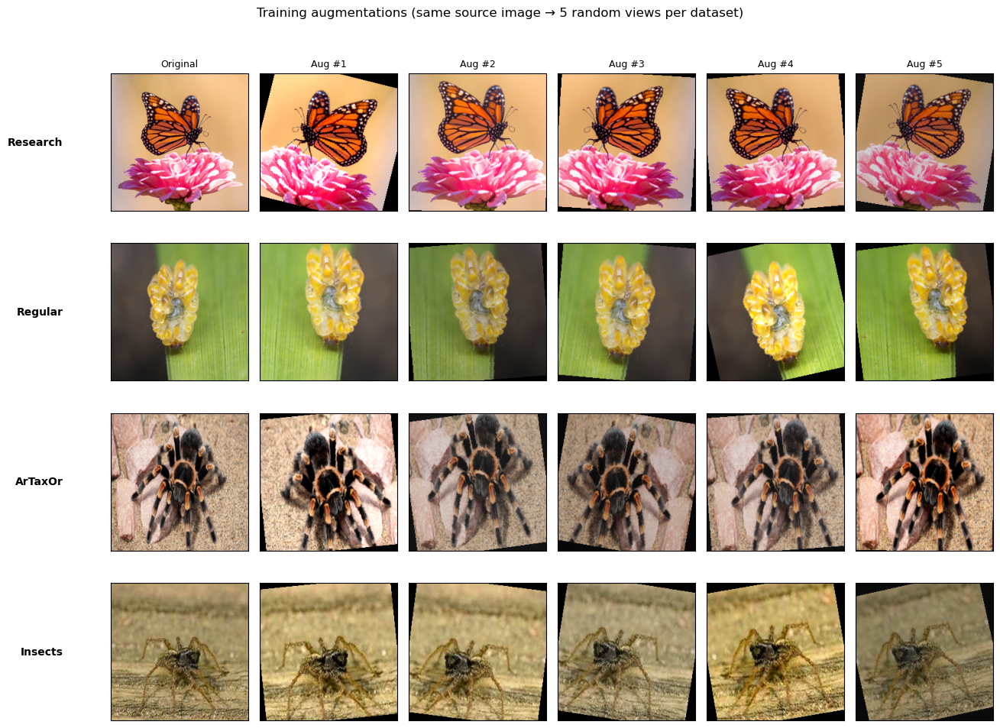

Saved: /home/resulted matrix/dataset_cls_augmented_samples.pdf


In [23]:
# Display augmented images from each dataset (train transforms)
from pathlib import Path
import random
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms import functional as TF

SPLIT = "train"
N_SHOW = 5          # augmented views per dataset
SEED = 42
DATA_ROOT = Path("dataset_classification")

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
DISPLAY = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rng = random.Random(SEED)

# use your training aug pipeline (already defined as train_tfms)
assert "train_tfms" in dir(), "Run the dataloader cell first (needs train_tfms)"

def denorm(t):
    """Undo ImageNet normalize for display."""
    mean = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
    std = torch.tensor([0.229, 0.224, 0.225])[:, None, None]
    x = (t.cpu() * std + mean).clamp(0, 1)
    return x.permute(1, 2, 0).numpy()

fig, axes = plt.subplots(
    len(DATASET_NAMES), N_SHOW + 1,
    figsize=(2.2 * (N_SHOW + 1), 2.4 * len(DATASET_NAMES)),
)

for i, name in enumerate(DATASET_NAMES):
    folder = DATA_ROOT / SPLIT / name
    files = [p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS]
    assert files, f"No images in {folder}"
    src = rng.choice(files)
    pil = Image.open(src).convert("RGB")

    # column 0: original (resized for fair view)
    ax = axes[i, 0]
    ax.imshow(pil.resize((224, 224)))
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_ylabel(DISPLAY[name], fontsize=10, fontweight="bold",
                  rotation=0, labelpad=45, va="center", ha="right")
    if i == 0:
        ax.set_title("Original", fontsize=9)

    # columns 1..N: different random augmentations of SAME image
    for j in range(N_SHOW):
        tens = train_tfms(pil)          # random crop/flip/jitter/...
        ax = axes[i, j + 1]
        ax.imshow(denorm(tens))
        ax.set_xticks([]); ax.set_yticks([])
        if i == 0:
            ax.set_title(f"Aug #{j+1}", fontsize=9)

fig.suptitle(
    "Training augmentations (same source image → 5 random views per dataset)",
    fontsize=12, y=1.01,
)
plt.tight_layout()

out = Path(cfg.fig_dir) if "cfg" in dir() else Path("resulted matrix")
out.mkdir(parents=True, exist_ok=True)
save_path = out / "dataset_cls_augmented_samples.pdf"
fig.savefig(save_path, bbox_inches="tight")
plt.show()
print("Saved:", save_path.resolve())

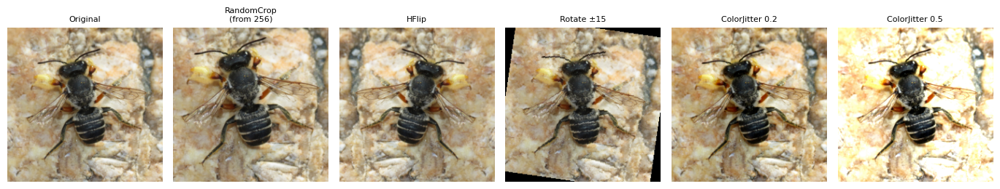

Saved: /home/resulted matrix/augmentation_demo_isolated.pdf


In [27]:
# Demo: ONE original image, each augmentation applied alone (+ save PDF)
from pathlib import Path
import random
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
import torch

DATA_ROOT = Path("dataset_classification/train/ArTaxOr")  # any folder
files = list(DATA_ROOT.glob("*"))
img = Image.open(random.choice(files)).convert("RGB")
base = transforms.Resize((224, 224))(img)

def show(ax, pil_or_tensor, title):
    if isinstance(pil_or_tensor, torch.Tensor):
        x = pil_or_tensor.detach().cpu()
        if x.ndim == 3 and x.shape[0] in (1, 3):
            x = x.permute(1, 2, 0).numpy()
        ax.imshow(x.clip(0, 1) if x.max() <= 1.5 else x.astype("uint8"))
    else:
        ax.imshow(pil_or_tensor)
    ax.set_title(title, fontsize=8)
    ax.axis("off")

demos = [
    ("Original", base),
    ("RandomCrop\n(from 256)", transforms.Compose([
        transforms.Resize((256, 256)), transforms.RandomCrop(224)
    ])(img)),
    ("HFlip", transforms.RandomHorizontalFlip(p=1.0)(base)),
    ("Rotate ±15", transforms.RandomRotation(15)(base)),
    ("ColorJitter 0.2", transforms.ColorJitter(0.2, 0.2, 0.2)(base)),
    ("ColorJitter 0.5", transforms.ColorJitter(0.5, 0.5, 0.5)(base)),
]

fig, axes = plt.subplots(1, len(demos), figsize=(2.3 * len(demos), 2.6))
for ax, (title, im) in zip(axes, demos):
    show(ax, im, title)
plt.tight_layout()

out = Path("resulted matrix")
out.mkdir(parents=True, exist_ok=True)
save_path = out / "augmentation_demo_isolated.pdf"
fig.savefig(save_path, bbox_inches="tight")
plt.show()
print("Saved:", save_path.resolve())

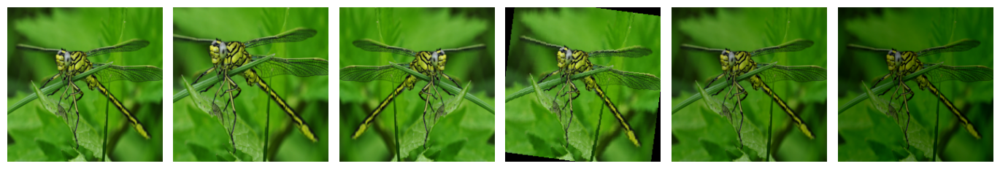

Saved: /home/resulted matrix/augmentation_demo_isolated62.pdf


In [17]:
# Demo: ONE original image, each augmentation applied alone (+ save PDF)
from pathlib import Path
import random
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
import torch

DATA_ROOT = Path("dataset_classification/train/ArTaxOr")  # any folder
files = list(DATA_ROOT.glob("*"))
img = Image.open(random.choice(files)).convert("RGB")
base = transforms.Resize((224, 224))(img)

def show(ax, pil_or_tensor, title):
    if isinstance(pil_or_tensor, torch.Tensor):
        x = pil_or_tensor.detach().cpu()
        if x.ndim == 3 and x.shape[0] in (1, 3):
            x = x.permute(1, 2, 0).numpy()
        ax.imshow(x.clip(0, 1) if x.max() <= 1.5 else x.astype("uint8"))
    else:
        ax.imshow(pil_or_tensor)
    ax.set_title(title, fontsize=8)
    ax.axis("off")

demos = [
    ("", base),
    ("", transforms.Compose([
        transforms.Resize((256, 256)), transforms.RandomCrop(224)
    ])(img)),
    ("", transforms.RandomHorizontalFlip(p=1.0)(base)),
    ("", transforms.RandomRotation(15)(base)),
    ("", transforms.ColorJitter(0.2, 0.2, 0.2)(base)),
    ("", transforms.ColorJitter(0.5, 0.5, 0.5)(base)),
]

fig, axes = plt.subplots(1, len(demos), figsize=(2.3 * len(demos), 2.6))
for ax, (title, im) in zip(axes, demos):
    show(ax, im, title)
plt.tight_layout()

out = Path("resulted matrix")
out.mkdir(parents=True, exist_ok=True)
save_path = out / "augmentation_demo_isolated62.pdf"
fig.savefig(save_path, bbox_inches="tight")
plt.show()
print("Saved:", save_path.resolve())

In [14]:
# Check GPU processes / memory usage
import subprocess
import pandas as pd

print("=== nvidia-smi (summary) ===")
print(subprocess.check_output(["nvidia-smi"], text=True))

print("\n=== processes using GPU ===")
try:
    out = subprocess.check_output(
        [
            "nvidia-smi",
            "--query-compute-apps=pid,process_name,used_gpu_memory",
            "--format=csv,noheader,nounits",
        ],
        text=True,
    ).strip()
except subprocess.CalledProcessError as e:
    print("nvidia-smi failed:", e)
    out = ""

rows = []
if out:
    for line in out.splitlines():
        parts = [p.strip() for p in line.split(",")]
        if len(parts) >= 3:
            pid, name, mem = parts[0], parts[1], parts[2]
            rows.append({"pid": int(pid), "process": name, "used_mem_MiB": int(mem)})

df = pd.DataFrame(rows)
if df.empty:
    print("No compute processes reported (GPU free or query unsupported).")
else:
    df = df.sort_values("used_mem_MiB", ascending=False).reset_index(drop=True)
    print(df.to_string(index=False))
    print(f"\nNumber of GPU processes: {len(df)}")
    print(f"Total used by listed processes: {df['used_mem_MiB'].sum()} MiB")

# PyTorch view (this kernel only)
import torch
if torch.cuda.is_available():
    free, total = torch.cuda.mem_get_info()
    print(f"\nThis process CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"Free/Total (torch): {free/1024**3:.2f} / {total/1024**3:.2f} GiB")
else:
    print("\nCUDA not available in this kernel")

=== nvidia-smi (summary) ===
Mon Aug 31 08:35:51 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.159.03             Driver Version: 580.159.03     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA TITAN Xp                Off |   00000000:05:00.0 Off |                  N/A |
|  0%   27C    P8             16W /  250W |   11343MiB /  12288MiB |      0%      Default |
|                                         |                        |                  N/A |
+------------------

In [10]:
import gc
import torch
from torch.utils.data import DataLoader

gc.collect()
torch.cuda.empty_cache()

cfg.batch_size = 8
cfg.num_workers = 2

free, total = torch.cuda.mem_get_info()
print(f"GPU free/total: {free/1024**3:.2f} / {total/1024**3:.2f} GiB")
print("Using batch_size =", cfg.batch_size)

loader_kw = dict(
    batch_size=cfg.batch_size,
    num_workers=cfg.num_workers,
    pin_memory=torch.cuda.is_available(),
    persistent_workers=False,
)
train_loader = DataLoader(train_ds, shuffle=True, **loader_kw)
val_loader   = DataLoader(val_ds, shuffle=False, **loader_kw)
test_loader  = DataLoader(test_ds, shuffle=False, **loader_kw)

print("batches/epoch (train):", len(train_loader))  # 16000/8 = 2000

GPU free/total: 1.56 / 11.90 GiB
Using batch_size = 8
batches/epoch (train): 2000


In [13]:
# Fix: truncated/corrupt images in dataset_classification
from pathlib import Path
from PIL import Image, ImageFile
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder

ImageFile.LOAD_TRUNCATED_IMAGES = True  # allow partial JPEGs

class SafeImageFolder(Dataset):
    """ImageFolder that skips unreadable/truncated images."""
    def __init__(self, root, transform=None):
        base = ImageFolder(root=str(root), transform=None)
        self.transform = transform
        self.classes = base.classes
        self.class_to_idx = base.class_to_idx
        self.samples = []
        self.bad = []
        for path, y in base.samples:
            try:
                with open(path, "rb") as f:
                    Image.open(f).convert("RGB").load()
                self.samples.append((path, y))
            except Exception:
                self.bad.append(path)
        if self.bad:
            print(f"[WARN] {root}: skipped {len(self.bad)} bad images")
            for p in self.bad[:10]:
                print("  ", p)
            if len(self.bad) > 10:
                print(f"  ... and {len(self.bad)-10} more")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, i):
        path, y = self.samples[i]
        img = Image.open(path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, y


train_ds = SafeImageFolder(cfg.data_root / "train", transform=train_tfms)
val_ds   = SafeImageFolder(cfg.data_root / "val",   transform=eval_tfms)
test_ds  = SafeImageFolder(cfg.data_root / "test",  transform=eval_tfms)

assert train_ds.classes == cfg.class_names, (train_ds.classes, cfg.class_names)
print("train/val/test:", len(train_ds), len(val_ds), len(test_ds))

loader_kw = dict(
    batch_size=cfg.batch_size,  # keep 8
    num_workers=0,              # easier to debug; set 2 later if stable
    pin_memory=torch.cuda.is_available(),
)
train_loader = DataLoader(train_ds, shuffle=True, **loader_kw)
val_loader   = DataLoader(val_ds, shuffle=False, **loader_kw)
test_loader  = DataLoader(test_ds, shuffle=False, **loader_kw)
print("Loaders ready.")

train/val/test: 16000 2400 2401
Loaders ready.


In [14]:
pl.seed_everything(cfg.seed, workers=True)
model = DatasetClassifierConvNeXt(cfg)

ckpt_cb = ModelCheckpoint(
    dirpath=cfg.ckpt_dir,
    filename="dscls-{epoch:02d}-{val_loss:.4f}",
    monitor=cfg.monitor_metric,
    mode=cfg.monitor_mode,
    save_top_k=1,
    save_last=True,
)
es_cb = EarlyStopping(
    monitor=cfg.monitor_metric,
    mode=cfg.monitor_mode,
    patience=cfg.early_stop_patience,
    min_delta=cfg.early_stop_min_delta,
    verbose=True,
)

trainer = pl.Trainer(
    max_epochs=cfg.max_epochs,
    accelerator=ACCELERATOR,
    devices=DEVICES,
    callbacks=[ckpt_cb, es_cb, LearningRateMonitor(logging_interval="epoch")],
    logger=CSVLogger(cfg.log_dir, name=cfg.run_name),
    log_every_n_steps=10,
    deterministic=True,
)

print("=" * 64)
print("4-way DATASET classification (Liu & He style) — TRAIN only")
print("chance-level = 25%")
print("=" * 64)

trainer.fit(model, train_dataloaders=train_loader, val_dataloaders=val_loader)

BEST_CKPT = ckpt_cb.best_model_path
best_val = float(ckpt_cb.best_model_score) if ckpt_cb.best_model_score is not None else float("nan")
print("BEST_CKPT:", BEST_CKPT)
print("best_val_loss:", best_val)

meta = {
    "task": "4-way dataset classification",
    "paper": "Liu & He arXiv:2403.08632 (adapted scale + locked HP)",
    "chance": 0.25,
    "lr": cfg.lr,
    "weight_decay": cfg.weight_decay,
    "dropout_p": cfg.dropout_p,
    "best_val_loss": best_val,
    "best_ckpt": BEST_CKPT,
    "class_names": cfg.class_names,
}
meta_path = Path(cfg.fig_dir) / "dataset_cls_4way_meta.json"
meta_path.write_text(json.dumps(meta, indent=2))
print("Wrote", meta_path.resolve())
print("Run the TEST cell next.")

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type               | Params | Mode  | FLOPs
-----------------------------------------------------------------
0 | backbone  | ConvNeXt           | 27.8 M | train | 0    
1 | criterion | CrossEntropyLoss   | 0      | train | 0    
2 | train_acc | MulticlassAccuracy | 0      | train | 0    
3 | val_acc   | MulticlassAccuracy | 0      | train | 0    
4 | test_acc  | MulticlassAccuracy | 0      | train | 0    
-----------------------------------------------------------------
27.8 M    Trainable params
0         Non-trainable params
27.8 M    Total params
111.293   Total estimated model params size (MB)
208       

4-way DATASET classification (Liu & He style) — TRAIN only
chance-level = 25%


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 0.807


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 12 records. Best score: 0.807. Signaling Trainer to stop.


BEST_CKPT: /home/checkpoints_dataset_cls_4way/dscls-epoch=00-val_loss=0.8072.ckpt
best_val_loss: 0.8071714043617249
Wrote /home/resulted matrix/dataset_cls_4way_meta.json
Run the TEST cell next.


BEST_CKPT: /home/checkpoints_dataset_cls_4way/dscls-epoch=00-val_loss=0.8072.ckpt
TEST accuracy: 0.6335 (63.35%)
Chance level:  0.25 (25%)
Lift vs chance: 2.53x


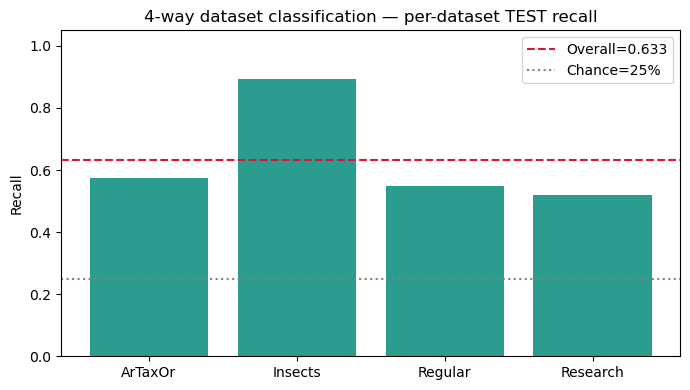

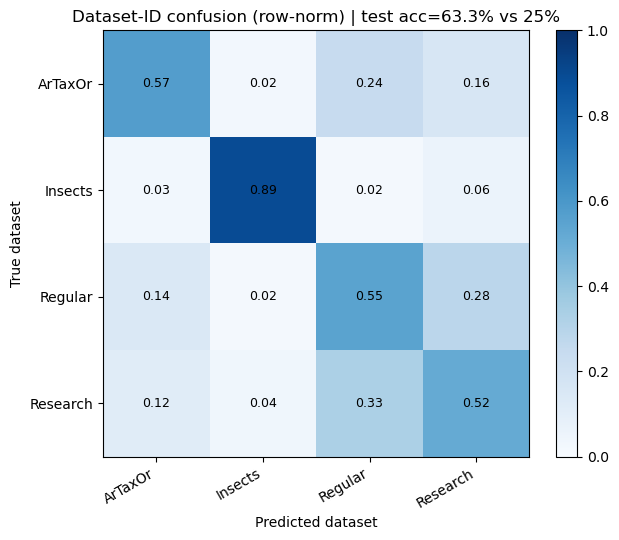

Saved:
  /home/resulted matrix/dataset_cls_4way_per_class_test.pdf 
  /home/resulted matrix/dataset_cls_4way_confusion.pdf 
  /home/resulted matrix/dataset_cls_4way_meta.json


In [15]:
# TEST: 4-way dataset classification (best val_loss ckpt)
FIG_DIR = Path(cfg.fig_dir)
FIG_DIR.mkdir(parents=True, exist_ok=True)

if "BEST_CKPT" not in dir() or not BEST_CKPT:
    meta_path = FIG_DIR / "dataset_cls_4way_meta.json"
    if meta_path.exists():
        BEST_CKPT = json.loads(meta_path.read_text())["best_ckpt"]
    else:
        cands = list(Path(cfg.ckpt_dir).glob("*-val_loss=*.ckpt"))
        assert cands, f"No ckpts in {cfg.ckpt_dir}"
        BEST_CKPT = str(min(cands, key=lambda p: float(p.stem.split("val_loss=")[-1])))
print("BEST_CKPT:", BEST_CKPT)

best_model = DatasetClassifierConvNeXt.load_from_checkpoint(
    BEST_CKPT, cfg=cfg, strict=False
).to(DEVICE).eval()

y_true, y_pred = [], []
with torch.no_grad():
    for images, labels in test_loader:
        preds = best_model(images.to(DEVICE)).argmax(1).cpu()
        y_true.append(labels)
        y_pred.append(preds)

y_true = torch.cat(y_true).numpy()
y_pred = torch.cat(y_pred).numpy()
TEST_ACC = float((y_true == y_pred).mean())
CHANCE = 0.25

print("=" * 64)
print(f"TEST accuracy: {TEST_ACC:.4f} ({TEST_ACC*100:.2f}%)")
print(f"Chance level:  {CHANCE:.2f} ({CHANCE*100:.0f}%)")
print(f"Lift vs chance: {TEST_ACC / CHANCE:.2f}x")
print("=" * 64)

# short labels for plots
short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
disp = [short.get(c, c) for c in cfg.class_names]

cm = np.zeros((cfg.num_classes, cfg.num_classes), dtype=np.int64)
for t, p in zip(y_true, y_pred):
    cm[t, p] += 1
cm_norm = cm / cm.sum(axis=1, keepdims=True).clip(min=1)

# per-class recall bars
fig, ax = plt.subplots(figsize=(7, 4))
per_class = cm.diagonal() / cm.sum(axis=1).clip(min=1)
ax.bar(disp, per_class, color="#2a9d8f")
ax.axhline(TEST_ACC, color="crimson", ls="--", label=f"Overall={TEST_ACC:.3f}")
ax.axhline(CHANCE, color="gray", ls=":", label="Chance=25%")
ax.set_ylim(0, 1.05)
ax.set_ylabel("Recall")
ax.set_title("4-way dataset classification — per-dataset TEST recall")
ax.legend()
plt.tight_layout()
p1 = FIG_DIR / "dataset_cls_4way_per_class_test.pdf"
fig.savefig(p1, bbox_inches="tight")
plt.show()

# confusion matrix
fig, ax = plt.subplots(figsize=(6.5, 5.5))
im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks(range(cfg.num_classes))
ax.set_yticks(range(cfg.num_classes))
ax.set_xticklabels(disp, rotation=30, ha="right")
ax.set_yticklabels(disp)
ax.set_xlabel("Predicted dataset")
ax.set_ylabel("True dataset")
ax.set_title(f"Dataset-ID confusion (row-norm) | test acc={TEST_ACC:.1%} vs 25%")
for i in range(cfg.num_classes):
    for j in range(cfg.num_classes):
        ax.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center", fontsize=9)
fig.colorbar(im, ax=ax, fraction=0.046)
plt.tight_layout()
p2 = FIG_DIR / "dataset_cls_4way_confusion.pdf"
fig.savefig(p2, bbox_inches="tight")
plt.show()

# update meta with test
meta_path = FIG_DIR / "dataset_cls_4way_meta.json"
meta = json.loads(meta_path.read_text()) if meta_path.exists() else {}
meta.update({
    "test_acc": TEST_ACC,
    "chance": CHANCE,
    "lift_vs_chance": float(TEST_ACC / CHANCE),
    "best_ckpt": BEST_CKPT,
    "confusion_counts": cm.tolist(),
})
meta_path.write_text(json.dumps(meta, indent=2))

print("Saved:\n ", p1.resolve(), "\n ", p2.resolve(), "\n ", meta_path.resolve())

Loaded: lightning_logs_dataset_cls_4way/e2e_locked_lr5e5/version_4/metrics.csv
  train_loss -> train_loss (13 epochs)
  train_acc -> train_acc (13 epochs)
  val_loss -> val_loss (13 epochs)
  val_acc -> val_acc (13 epochs)
 epoch  train_loss  train_acc  val_loss  val_acc
     0    0.957437   0.561375  0.807171 0.628750
     1    0.755096   0.663125  0.811963 0.632083
     2    0.625775   0.730062  0.834480 0.635417
     3    0.489449   0.802688  0.882882 0.644167
     4    0.283217   0.896062  0.987346 0.650833
     5    0.188484   0.933500  1.174228 0.635833
     6    0.142976   0.949625  1.291636 0.646250
     7    0.091546   0.970437  1.393272 0.637500
     8    0.073972   0.975813  1.452001 0.647917
     9    0.061229   0.980687  1.590464 0.638333


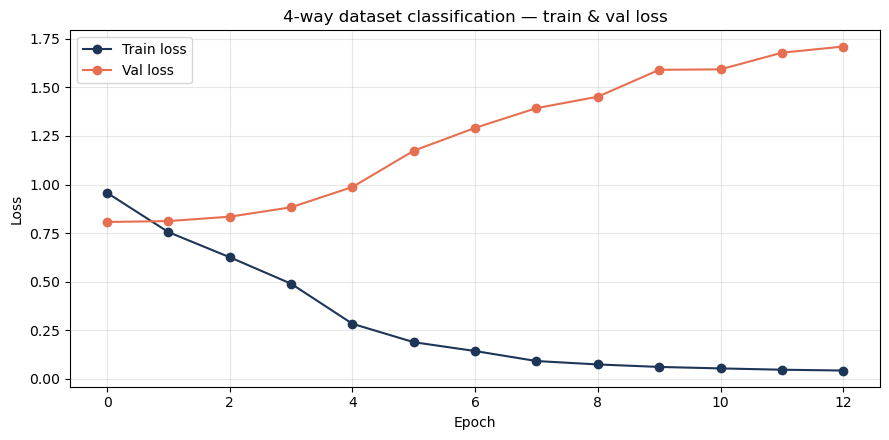

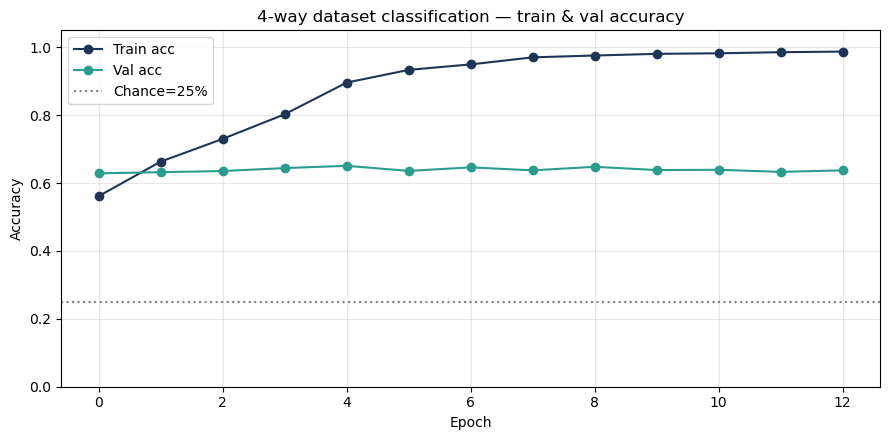

Saved:
  /home/resulted matrix/dataset_cls_4way_train_val_loss.pdf 
  /home/resulted matrix/dataset_cls_4way_train_val_acc.pdf


In [16]:
# Train/val loss + accuracy curves (4-way dataset classification)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

FIG_DIR = Path(cfg.fig_dir)
FIG_DIR.mkdir(parents=True, exist_ok=True)

def load_epoch_metrics(log_root: str, run_name: str):
    run_dir = Path(log_root) / run_name
    versions = sorted(run_dir.glob("version_*"))
    assert versions, f"No versions under {run_dir}"
    csv_path = versions[-1] / "metrics.csv"
    df = pd.read_csv(csv_path)
    print("Loaded:", csv_path)

    df = df.copy()
    df["epoch"] = pd.to_numeric(df["epoch"], errors="coerce").ffill()
    df = df.dropna(subset=["epoch"])
    df["epoch"] = df["epoch"].astype(int)

    candidates = {
        "train_loss": ["train_loss_epoch", "train_loss"],
        "train_acc":  ["train_acc_epoch", "train_acc"],
        "val_loss":   ["val_loss"],
        "val_acc":    ["val_acc"],
    }
    parts = []
    for dst, src_list in candidates.items():
        src = next((c for c in src_list if c in df.columns), None)
        if src is None:
            print(f"  [warn] missing {dst}")
            continue
        sub = df[["epoch", src]].copy()
        sub[src] = pd.to_numeric(sub[src], errors="coerce")
        sub = sub.dropna(subset=[src])
        ep = sub.groupby("epoch", as_index=False)[src].last().rename(columns={src: dst})
        parts.append(ep)
        print(f"  {src} -> {dst} ({len(ep)} epochs)")

    out = parts[0]
    for p in parts[1:]:
        out = out.merge(p, on="epoch", how="outer")
    return out.sort_values("epoch").reset_index(drop=True)

epoch_df = load_epoch_metrics(cfg.log_dir, cfg.run_name)
print(epoch_df.head(10).to_string(index=False))

# LOSS
fig, ax = plt.subplots(figsize=(9, 4.5))
if "train_loss" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["train_loss"], marker="o", label="Train loss", color="#1d3557")
if "val_loss" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["val_loss"], marker="o", label="Val loss", color="#e76f51")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_title("4-way dataset classification — train & val loss")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
p1 = FIG_DIR / "dataset_cls_4way_train_val_loss.pdf"
fig.savefig(p1, bbox_inches="tight")
plt.show()

# ACC
fig, ax = plt.subplots(figsize=(9, 4.5))
if "train_acc" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["train_acc"], marker="o", label="Train acc", color="#1d3557")
if "val_acc" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["val_acc"], marker="o", label="Val acc", color="#2a9d8f")
ax.axhline(0.25, color="gray", ls=":", label="Chance=25%")
ax.set_xlabel("Epoch")
ax.set_ylabel("Accuracy")
ax.set_ylim(0, 1.05)
ax.set_title("4-way dataset classification — train & val accuracy")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
p2 = FIG_DIR / "dataset_cls_4way_train_val_acc.pdf"
fig.savefig(p2, bbox_inches="tight")
plt.show()

print("Saved:\n ", p1.resolve(), "\n ", p2.resolve())

In [17]:
# F1: freeze ConvNeXt backbone, train 4-way head only
from pathlib import Path
import copy
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import CSVLogger

cfg_f1 = copy.deepcopy(cfg)
cfg_f1.lr = 1e-3          # higher LR OK for head-only
cfg_f1.weight_decay = 1e-3
cfg_f1.dropout_p = 0.3
cfg_f1.label_smoothing = 0.0
cfg_f1.ckpt_dir = "checkpoints_dataset_cls_4way_head"
cfg_f1.log_dir = "lightning_logs_dataset_cls_4way"
cfg_f1.run_name = "head_only_lr1e3"
Path(cfg_f1.ckpt_dir).mkdir(parents=True, exist_ok=True)

class DatasetClassifierHeadOnly(DatasetClassifierConvNeXt):
    def __init__(self, cfg):
        super().__init__(cfg)
        # freeze everything
        for p in self.parameters():
            p.requires_grad = False
        # unfreeze classifier head only
        for p in self.backbone.classifier.parameters():
            p.requires_grad = True
        n_train = sum(p.numel() for p in self.parameters() if p.requires_grad)
        n_all = sum(p.numel() for p in self.parameters())
        print(f"Trainable: {n_train:,} / {n_all:,}")

    def configure_optimizers(self):
        params = [p for p in self.parameters() if p.requires_grad]
        opt = torch.optim.AdamW(params, lr=self.cfg.lr, weight_decay=self.cfg.weight_decay)
        sch = torch.optim.lr_scheduler.ReduceLROnPlateau(
            opt, mode="min", factor=0.5, patience=2, min_lr=1e-7
        )
        return {"optimizer": opt, "lr_scheduler": {"scheduler": sch, "monitor": "val_loss", "interval": "epoch"}}

pl.seed_everything(cfg_f1.seed, workers=True)
model_f1 = DatasetClassifierHeadOnly(cfg_f1)

ckpt_cb = ModelCheckpoint(
    dirpath=cfg_f1.ckpt_dir,
    filename="dscls-head-{epoch:02d}-{val_loss:.4f}",
    monitor="val_loss", mode="min", save_top_k=1, save_last=True,
)
es_cb = EarlyStopping(monitor="val_loss", mode="min", patience=12, min_delta=1e-3, verbose=True)

trainer_f1 = pl.Trainer(
    max_epochs=cfg_f1.max_epochs,
    accelerator=ACCELERATOR,
    devices=DEVICES,
    callbacks=[ckpt_cb, es_cb, LearningRateMonitor(logging_interval="epoch")],
    logger=CSVLogger(cfg_f1.log_dir, name=cfg_f1.run_name),
    log_every_n_steps=10,
    deterministic=True,
)

print("F1 head-only FT | compare val_acc to previous ~63%")
trainer_f1.fit(model_f1, train_dataloaders=train_loader, val_dataloaders=val_loader)

BEST_CKPT_F1 = ckpt_cb.best_model_path
print("BEST_CKPT_F1:", BEST_CKPT_F1, "best_val_loss:", float(ckpt_cb.best_model_score))

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type               | Params | Mode  | FLOPs
-----------------------------------------------------------------
0 | backbone  | ConvNeXt           | 27.8 M | train | 0    
1 | criterion | CrossEntropyLoss   | 0      | train | 0    
2 | train_acc | MulticlassAccuracy | 0      | train | 0    
3 | val_acc   | MulticlassAccuracy | 0      | train | 0    
4 | test_acc  | MulticlassAccuracy | 0      | train | 0    
-----------------------------------------------------------------
4.6 K     Trainable params
27.8 M    Non-trainable params
27.8 M    Total params
111.293   Total estimated model params size (MB)
208       

Trainable: 4,612 / 27,823,204
F1 head-only FT | compare val_acc to previous ~63%


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 0.965


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 0.001. New best score: 0.944


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.001. New best score: 0.932


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.007 >= min_delta = 0.001. New best score: 0.925


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.001. New best score: 0.924


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.922


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 0.001. New best score: 0.919


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 0.001. New best score: 0.911


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.004 >= min_delta = 0.001. New best score: 0.907


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 0.001. New best score: 0.904


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.007 >= min_delta = 0.001. New best score: 0.897


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.895


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 12 records. Best score: 0.895. Signaling Trainer to stop.


BEST_CKPT_F1: /home/checkpoints_dataset_cls_4way_head/dscls-head-epoch=25-val_loss=0.8950.ckpt best_val_loss: 0.8950422406196594


Using: /home/checkpoints_dataset_cls_4way_head/dscls-head-epoch=25-val_loss=0.8950.ckpt | tag: head
Trainable: 4,612 / 27,823,204
TEST accuracy: 0.5981 (59.81%)
Chance level:  0.25 (25%)
Lift vs chance: 2.39x


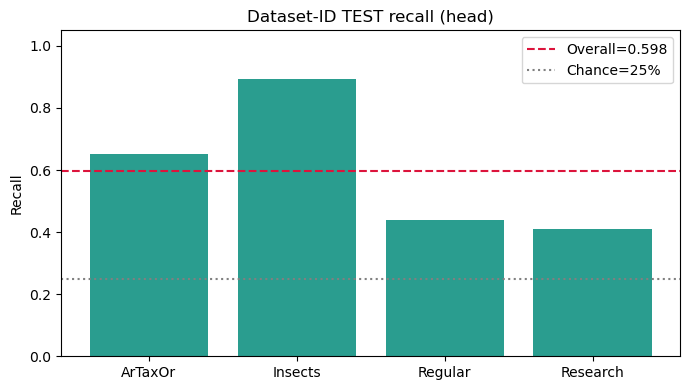

Saved: /home/resulted matrix/dataset_cls_4way_head_per_class_test.pdf


In [18]:
# TEST cell — 4-way dataset classification
from pathlib import Path
import json
import numpy as np
import torch
import matplotlib.pyplot as plt

FIG_DIR = Path(cfg.fig_dir)
FIG_DIR.mkdir(parents=True, exist_ok=True)

# pick best ckpt: prefer head-only F1, else e2e
if "BEST_CKPT_F1" in dir() and BEST_CKPT_F1:
    BEST_CKPT = BEST_CKPT_F1
    load_cls = DatasetClassifierHeadOnly  # head-only run
    tag = "head"
elif "BEST_CKPT" in dir() and BEST_CKPT:
    load_cls = DatasetClassifierConvNeXt
    tag = "e2e"
else:
    # fallback: newest meta / lowest val_loss on disk
    for folder, cls, t in [
        ("checkpoints_dataset_cls_4way_head", "DatasetClassifierHeadOnly", "head"),
        ("checkpoints_dataset_cls_4way", "DatasetClassifierConvNeXt", "e2e"),
    ]:
        cands = list(Path(folder).glob("*-val_loss=*.ckpt"))
        if cands:
            BEST_CKPT = str(min(cands, key=lambda p: float(p.stem.split("val_loss=")[-1])))
            load_cls = DatasetClassifierHeadOnly if t == "head" else DatasetClassifierConvNeXt
            tag = t
            break
    else:
        raise FileNotFoundError("No dataset-cls checkpoints found")

print("Using:", BEST_CKPT, "| tag:", tag)

# cfg for load (head run may use cfg_f1)
cfg_load = cfg_f1 if tag == "head" and "cfg_f1" in dir() else cfg

best_model = load_cls.load_from_checkpoint(BEST_CKPT, cfg=cfg_load, strict=False).to(DEVICE).eval()

y_true, y_pred = [], []
with torch.no_grad():
    for images, labels in test_loader:
        preds = best_model(images.to(DEVICE)).argmax(1).cpu()
        y_true.append(labels)
        y_pred.append(preds)

y_true = torch.cat(y_true).numpy()
y_pred = torch.cat(y_pred).numpy()
TEST_ACC = float((y_true == y_pred).mean())
CHANCE = 0.25

print("=" * 64)
print(f"TEST accuracy: {TEST_ACC:.4f} ({TEST_ACC*100:.2f}%)")
print(f"Chance level:  {CHANCE:.2f} ({CHANCE*100:.0f}%)")
print(f"Lift vs chance: {TEST_ACC / CHANCE:.2f}x")
print("=" * 64)

short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
disp = [short.get(c, c) for c in cfg_load.class_names]

cm = np.zeros((cfg_load.num_classes, cfg_load.num_classes), dtype=np.int64)
for t, p in zip(y_true, y_pred):
    cm[t, p] += 1
cm_norm = cm / cm.sum(axis=1, keepdims=True).clip(min=1)

fig, ax = plt.subplots(figsize=(7, 4))
per_class = cm.diagonal() / cm.sum(axis=1).clip(min=1)
ax.bar(disp, per_class, color="#2a9d8f")
ax.axhline(TEST_ACC, color="crimson", ls="--", label=f"Overall={TEST_ACC:.3f}")
ax.axhline(CHANCE, color="gray", ls=":", label="Chance=25%")
ax.set_ylim(0, 1.05)
ax.set_ylabel("Recall")
ax.set_title(f"Dataset-ID TEST recall ({tag})")
ax.legend()
plt.tight_layout()
p_bar = FIG_DIR / f"dataset_cls_4way_{tag}_per_class_test.pdf"
fig.savefig(p_bar, bbox_inches="tight")
plt.show()
print("Saved:", p_bar.resolve())

Loaded: lightning_logs_dataset_cls_4way/head_only_lr1e3/version_0/metrics.csv
  train_loss -> train_loss (38 epochs)
  train_acc -> train_acc (38 epochs)
  val_loss -> val_loss (38 epochs)
  val_acc -> val_acc (38 epochs)
 epoch  train_loss  train_acc  val_loss  val_acc
     0    1.077740   0.511688  0.964962 0.568750
     1    1.016255   0.544438  0.944426 0.575417
     2    1.003088   0.546875  0.931702 0.582917
     3    0.996419   0.551500  0.924910 0.584167
     4    1.007287   0.550687  0.935056 0.582083
     5    1.002221   0.555187  0.923996 0.590833
     6    0.999487   0.553563  0.923863 0.586667
     7    0.998159   0.550250  0.921623 0.580833
     8    0.995101   0.552688  0.918832 0.591667
     9    0.995302   0.552938  0.934573 0.577500
    10    0.993580   0.554438  0.910886 0.595833
    11    0.987304   0.561063  0.931415 0.578750
    12    0.986691   0.557625  0.915028 0.588750
    13    0.985665   0.558250  0.907124 0.592500
    14    0.988910   0.557312  0.911466 0.5

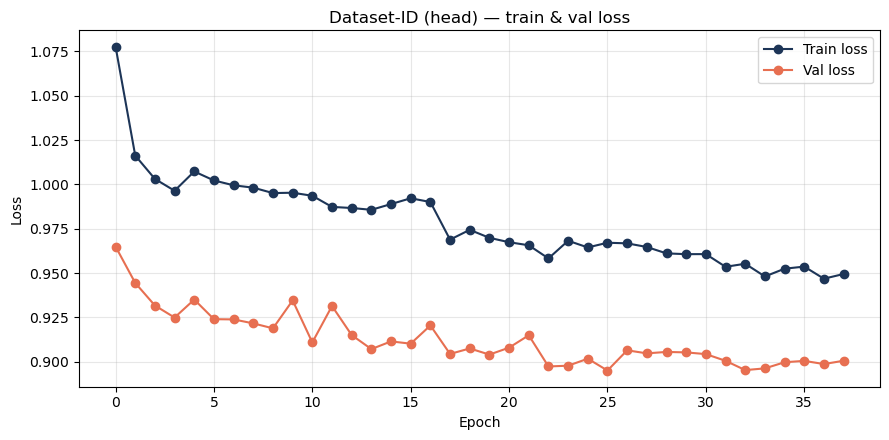

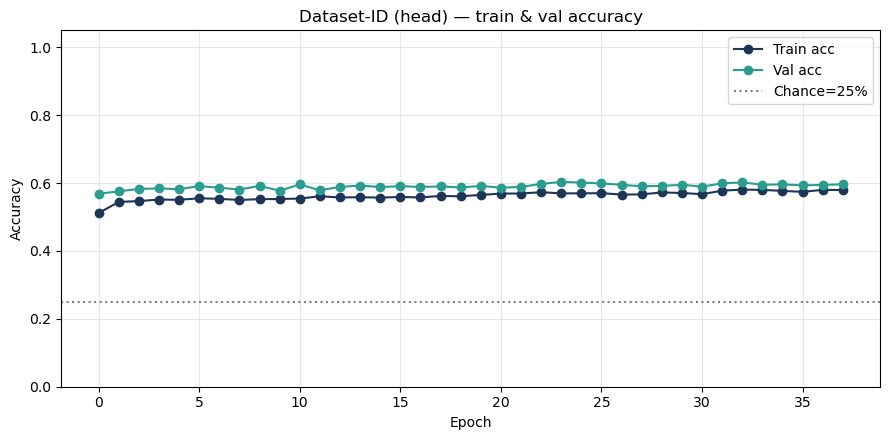

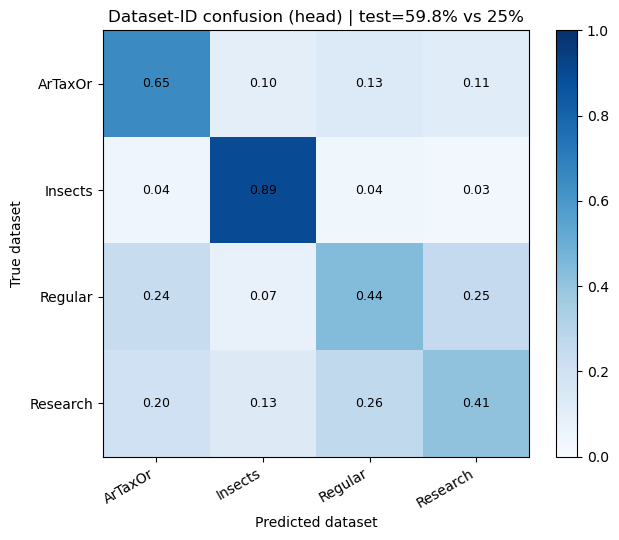

Saved:
  /home/resulted matrix/dataset_cls_4way_head_train_val_loss.pdf 
  /home/resulted matrix/dataset_cls_4way_head_train_val_acc.pdf 
  /home/resulted matrix/dataset_cls_4way_head_confusion.pdf


In [19]:
# Curves (train/val loss+acc) + confusion matrix
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

FIG_DIR = Path(cfg.fig_dir)
FIG_DIR.mkdir(parents=True, exist_ok=True)

# match log name to the run you trained
if "tag" in dir() and tag == "head":
    log_dir = cfg_f1.log_dir if "cfg_f1" in dir() else cfg.log_dir
    run_name = cfg_f1.run_name if "cfg_f1" in dir() else "head_only_lr1e3"
elif "cfg_f1" in dir() and Path(cfg_f1.log_dir, cfg_f1.run_name).exists():
    log_dir, run_name, tag = cfg_f1.log_dir, cfg_f1.run_name, "head"
else:
    log_dir, run_name, tag = cfg.log_dir, cfg.run_name, "e2e"

def load_epoch_metrics(log_root: str, run_name: str):
    run_dir = Path(log_root) / run_name
    versions = sorted(run_dir.glob("version_*"))
    assert versions, f"No versions under {run_dir}"
    csv_path = versions[-1] / "metrics.csv"
    df = pd.read_csv(csv_path)
    print("Loaded:", csv_path)

    df = df.copy()
    df["epoch"] = pd.to_numeric(df["epoch"], errors="coerce").ffill()
    df = df.dropna(subset=["epoch"])
    df["epoch"] = df["epoch"].astype(int)

    candidates = {
        "train_loss": ["train_loss_epoch", "train_loss"],
        "train_acc":  ["train_acc_epoch", "train_acc"],
        "val_loss":   ["val_loss"],
        "val_acc":    ["val_acc"],
    }
    parts = []
    for dst, src_list in candidates.items():
        src = next((c for c in src_list if c in df.columns), None)
        if src is None:
            print(f"  [warn] missing {dst}")
            continue
        sub = df[["epoch", src]].copy()
        sub[src] = pd.to_numeric(sub[src], errors="coerce")
        sub = sub.dropna(subset=[src])
        ep = sub.groupby("epoch", as_index=False)[src].last().rename(columns={src: dst})
        parts.append(ep)
        print(f"  {src} -> {dst} ({len(ep)} epochs)")

    out = parts[0]
    for p in parts[1:]:
        out = out.merge(p, on="epoch", how="outer")
    return out.sort_values("epoch").reset_index(drop=True)

epoch_df = load_epoch_metrics(log_dir, run_name)
print(epoch_df.head(15).to_string(index=False))

# --- LOSS ---
fig, ax = plt.subplots(figsize=(9, 4.5))
if "train_loss" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["train_loss"], marker="o", label="Train loss", color="#1d3557")
if "val_loss" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["val_loss"], marker="o", label="Val loss", color="#e76f51")
ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
ax.set_title(f"Dataset-ID ({tag}) — train & val loss")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
p_loss = FIG_DIR / f"dataset_cls_4way_{tag}_train_val_loss.pdf"
fig.savefig(p_loss, bbox_inches="tight"); plt.show()

# --- ACC ---
fig, ax = plt.subplots(figsize=(9, 4.5))
if "train_acc" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["train_acc"], marker="o", label="Train acc", color="#1d3557")
if "val_acc" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["val_acc"], marker="o", label="Val acc", color="#2a9d8f")
ax.axhline(0.25, color="gray", ls=":", label="Chance=25%")
ax.set_xlabel("Epoch"); ax.set_ylabel("Accuracy"); ax.set_ylim(0, 1.05)
ax.set_title(f"Dataset-ID ({tag}) — train & val accuracy")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
p_acc = FIG_DIR / f"dataset_cls_4way_{tag}_train_val_acc.pdf"
fig.savefig(p_acc, bbox_inches="tight"); plt.show()

# --- CONFUSION (needs y_true/y_pred from TEST cell) ---
assert "y_true" in dir() and "cm_norm" in dir(), "Run TEST cell first"

short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
cfg_load = cfg_f1 if tag == "head" and "cfg_f1" in dir() else cfg
disp = [short.get(c, c) for c in cfg_load.class_names]

fig, ax = plt.subplots(figsize=(6.5, 5.5))
im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks(range(len(disp))); ax.set_yticks(range(len(disp)))
ax.set_xticklabels(disp, rotation=30, ha="right")
ax.set_yticklabels(disp)
ax.set_xlabel("Predicted dataset"); ax.set_ylabel("True dataset")
ax.set_title(f"Dataset-ID confusion ({tag}) | test={TEST_ACC:.1%} vs 25%")
for i in range(len(disp)):
    for j in range(len(disp)):
        ax.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center", fontsize=9)
fig.colorbar(im, ax=ax, fraction=0.046)
plt.tight_layout()
p_cm = FIG_DIR / f"dataset_cls_4way_{tag}_confusion.pdf"
fig.savefig(p_cm, bbox_inches="tight"); plt.show()

print("Saved:\n ", p_loss.resolve(), "\n ", p_acc.resolve(), "\n ", p_cm.resolve())

In [20]:
# F2: all params trainable | lr=1e-5, dropout=0.5, wd=3e-3
from pathlib import Path
import copy
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import CSVLogger

cfg_f2 = copy.deepcopy(cfg)
cfg_f2.lr = 1e-5
cfg_f2.weight_decay = 3e-3
cfg_f2.dropout_p = 0.5
cfg_f2.label_smoothing = 0.0
cfg_f2.ckpt_dir = "checkpoints_dataset_cls_4way_f2"
cfg_f2.log_dir = "lightning_logs_dataset_cls_4way"
cfg_f2.run_name = "e2e_lr1e5_wd3e3_do05"
Path(cfg_f2.ckpt_dir).mkdir(parents=True, exist_ok=True)

pl.seed_everything(cfg_f2.seed, workers=True)
model_f2 = DatasetClassifierConvNeXt(cfg_f2)  # all requires_grad=True inside

n_train = sum(p.numel() for p in model_f2.parameters() if p.requires_grad)
print(f"Trainable: {n_train:,} | lr={cfg_f2.lr}, wd={cfg_f2.weight_decay}, dropout={cfg_f2.dropout_p}")

ckpt_cb = ModelCheckpoint(
    dirpath=cfg_f2.ckpt_dir,
    filename="dscls-f2-{epoch:02d}-{val_loss:.4f}",
    monitor="val_loss", mode="min", save_top_k=1, save_last=True,
)
es_cb = EarlyStopping(monitor="val_loss", mode="min", patience=12, min_delta=1e-3, verbose=True)

trainer_f2 = pl.Trainer(
    max_epochs=cfg_f2.max_epochs,
    accelerator=ACCELERATOR,
    devices=DEVICES,
    callbacks=[ckpt_cb, es_cb, LearningRateMonitor(logging_interval="epoch")],
    logger=CSVLogger(cfg_f2.log_dir, name=cfg_f2.run_name),
    log_every_n_steps=10,
    deterministic=True,
)

print("F2 e2e + strong reg | goal: beat e2e test 63.35%")
trainer_f2.fit(model_f2, train_dataloaders=train_loader, val_dataloaders=val_loader)

BEST_CKPT_F2 = ckpt_cb.best_model_path
print("BEST_CKPT_F2:", BEST_CKPT_F2)
print("best_val_loss:", float(ckpt_cb.best_model_score))

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type               | Params | Mode  | FLOPs
-----------------------------------------------------------------
0 | backbone  | ConvNeXt           | 27.8 M | train | 0    
1 | criterion | CrossEntropyLoss   | 0      | train | 0    
2 | train_acc | MulticlassAccuracy | 0      | train | 0    
3 | val_acc   | MulticlassAccuracy | 0      | train | 0    
4 | test_acc  | MulticlassAccuracy | 0      | train | 0    
-----------------------------------------------------------------
27.8 M    Trainable params
0         Non-trainable params
27.8 M    Total params
111.293   Total estimated model params size (MB)
208       

Trainable: 27,823,204 | lr=1e-05, wd=0.003, dropout=0.5
F2 e2e + strong reg | goal: beat e2e test 63.35%


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 0.881


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.068 >= min_delta = 0.001. New best score: 0.813


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.022 >= min_delta = 0.001. New best score: 0.791


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 12 records. Best score: 0.791. Signaling Trainer to stop.


BEST_CKPT_F2: /home/checkpoints_dataset_cls_4way_f2/dscls-f2-epoch=02-val_loss=0.7910.ckpt
best_val_loss: 0.7909832000732422


BEST_CKPT_F2: /home/checkpoints_dataset_cls_4way_f2/dscls-f2-epoch=02-val_loss=0.7910.ckpt
F2 TEST accuracy: 0.6568 (65.68%)
Chance level:     0.25 (25%)
Lift vs chance:   2.63x
Compare → e2e 63.35% | head 59.81%


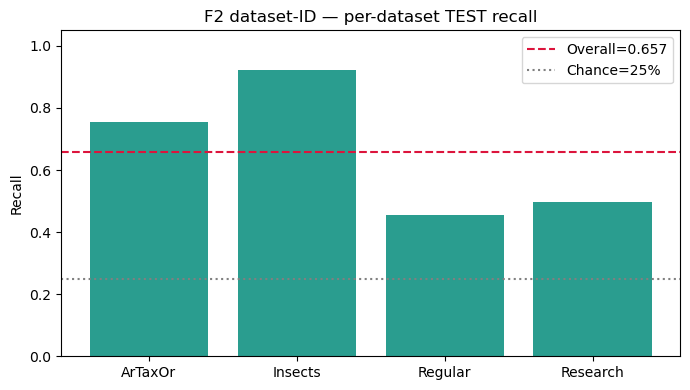

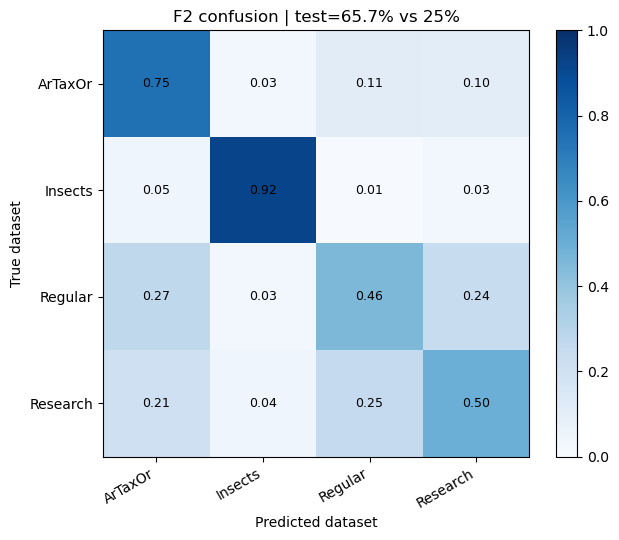

Saved:
  /home/resulted matrix/dataset_cls_4way_f2_per_class_test.pdf 
  /home/resulted matrix/dataset_cls_4way_f2_confusion.pdf 
  /home/resulted matrix/dataset_cls_4way_f2_meta.json


In [21]:
# TEST — F2 (e2e lr=1e-5, wd=3e-3, dropout=0.5)
from pathlib import Path
import json
import numpy as np
import torch
import matplotlib.pyplot as plt

FIG_DIR = Path(cfg.fig_dir)
FIG_DIR.mkdir(parents=True, exist_ok=True)

if "BEST_CKPT_F2" not in dir() or not BEST_CKPT_F2:
    cands = list(Path("checkpoints_dataset_cls_4way_f2").glob("*-val_loss=*.ckpt"))
    assert cands, "No F2 checkpoints found"
    BEST_CKPT_F2 = str(min(cands, key=lambda p: float(p.stem.split("val_loss=")[-1])))

print("BEST_CKPT_F2:", BEST_CKPT_F2)

cfg_load = cfg_f2 if "cfg_f2" in dir() else cfg
best_model = DatasetClassifierConvNeXt.load_from_checkpoint(
    BEST_CKPT_F2, cfg=cfg_load, strict=False
).to(DEVICE).eval()

y_true, y_pred = [], []
with torch.no_grad():
    for images, labels in test_loader:
        preds = best_model(images.to(DEVICE)).argmax(1).cpu()
        y_true.append(labels)
        y_pred.append(preds)

y_true = torch.cat(y_true).numpy()
y_pred = torch.cat(y_pred).numpy()
TEST_ACC = float((y_true == y_pred).mean())
CHANCE = 0.25

print("=" * 64)
print(f"F2 TEST accuracy: {TEST_ACC:.4f} ({TEST_ACC*100:.2f}%)")
print(f"Chance level:     {CHANCE:.2f} ({CHANCE*100:.0f}%)")
print(f"Lift vs chance:   {TEST_ACC / CHANCE:.2f}x")
print("Compare → e2e 63.35% | head 59.81%")
print("=" * 64)

short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
disp = [short.get(c, c) for c in cfg_load.class_names]

cm = np.zeros((cfg_load.num_classes, cfg_load.num_classes), dtype=np.int64)
for t, p in zip(y_true, y_pred):
    cm[t, p] += 1
cm_norm = cm / cm.sum(axis=1, keepdims=True).clip(min=1)

fig, ax = plt.subplots(figsize=(7, 4))
per_class = cm.diagonal() / cm.sum(axis=1).clip(min=1)
ax.bar(disp, per_class, color="#2a9d8f")
ax.axhline(TEST_ACC, color="crimson", ls="--", label=f"Overall={TEST_ACC:.3f}")
ax.axhline(CHANCE, color="gray", ls=":", label="Chance=25%")
ax.set_ylim(0, 1.05)
ax.set_ylabel("Recall")
ax.set_title("F2 dataset-ID — per-dataset TEST recall")
ax.legend()
plt.tight_layout()
p1 = FIG_DIR / "dataset_cls_4way_f2_per_class_test.pdf"
fig.savefig(p1, bbox_inches="tight")
plt.show()

fig, ax = plt.subplots(figsize=(6.5, 5.5))
im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks(range(len(disp)))
ax.set_yticks(range(len(disp)))
ax.set_xticklabels(disp, rotation=30, ha="right")
ax.set_yticklabels(disp)
ax.set_xlabel("Predicted dataset")
ax.set_ylabel("True dataset")
ax.set_title(f"F2 confusion | test={TEST_ACC:.1%} vs 25%")
for i in range(len(disp)):
    for j in range(len(disp)):
        ax.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center", fontsize=9)
fig.colorbar(im, ax=ax, fraction=0.046)
plt.tight_layout()
p2 = FIG_DIR / "dataset_cls_4way_f2_confusion.pdf"
fig.savefig(p2, bbox_inches="tight")
plt.show()

meta = {
    "run": "F2",
    "lr": getattr(cfg_load, "lr", 1e-5),
    "weight_decay": getattr(cfg_load, "weight_decay", 3e-3),
    "dropout_p": getattr(cfg_load, "dropout_p", 0.5),
    "test_acc": TEST_ACC,
    "chance": CHANCE,
    "lift_vs_chance": float(TEST_ACC / CHANCE),
    "best_ckpt": BEST_CKPT_F2,
}
meta_path = FIG_DIR / "dataset_cls_4way_f2_meta.json"
meta_path.write_text(json.dumps(meta, indent=2))
print("Saved:\n ", p1.resolve(), "\n ", p2.resolve(), "\n ", meta_path.resolve())

Loaded: lightning_logs_dataset_cls_4way/e2e_lr1e5_wd3e3_do05/version_0/metrics.csv
  train_loss -> train_loss (15 epochs)
  train_acc -> train_acc (15 epochs)
  val_loss -> val_loss (15 epochs)
  val_acc -> val_acc (15 epochs)
 epoch  train_loss  train_acc  val_loss  val_acc
     0    1.097872   0.492938  0.881000 0.600417
     1    0.872317   0.604437  0.812649 0.631250
     2    0.789691   0.644750  0.790983 0.641250
     3    0.729606   0.674625  0.800258 0.634167
     4    0.678006   0.698937  0.796027 0.626667
     5    0.626366   0.729563  0.805224 0.641250
     6    0.565234   0.758438  0.804219 0.646667
     7    0.531565   0.775875  0.852502 0.633333
     8    0.500504   0.793000  0.846016 0.647500
     9    0.467522   0.809188  0.851823 0.645417
    10    0.450416   0.818250  0.858665 0.643333
    11    0.431831   0.826063  0.879185 0.639583
    12    0.416251   0.832938  0.886895 0.644583
    13    0.407997   0.836937  0.901823 0.640417
    14    0.394803   0.843812  0.91347

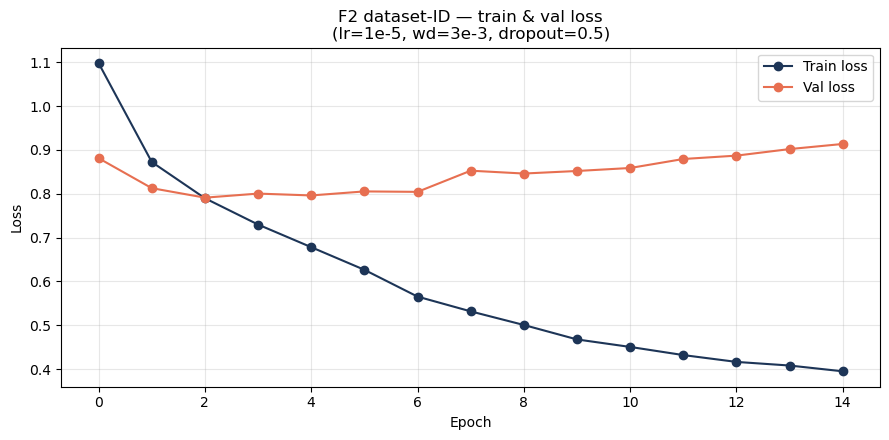

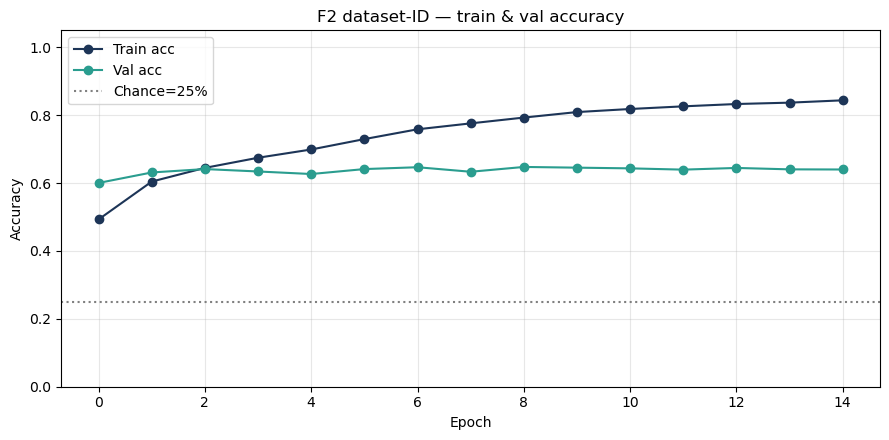

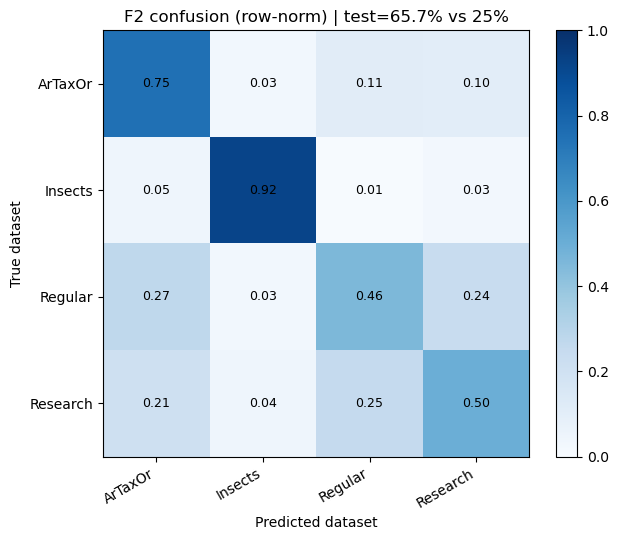

Saved:
  /home/resulted matrix/dataset_cls_4way_f2_train_val_loss.pdf 
  /home/resulted matrix/dataset_cls_4way_f2_train_val_acc.pdf 
  /home/resulted matrix/dataset_cls_4way_f2_confusion.pdf


In [22]:
# F2: train/val loss+acc curves + confusion matrix
from pathlib import Path
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt

FIG_DIR = Path(cfg.fig_dir)
FIG_DIR.mkdir(parents=True, exist_ok=True)

log_dir = cfg_f2.log_dir if "cfg_f2" in dir() else "lightning_logs_dataset_cls_4way"
run_name = cfg_f2.run_name if "cfg_f2" in dir() else "e2e_lr1e5_wd3e3_do05"

def load_epoch_metrics(log_root: str, run_name: str):
    run_dir = Path(log_root) / run_name
    versions = sorted(run_dir.glob("version_*"))
    assert versions, f"No versions under {run_dir}"
    csv_path = versions[-1] / "metrics.csv"
    df = pd.read_csv(csv_path)
    print("Loaded:", csv_path)

    df = df.copy()
    df["epoch"] = pd.to_numeric(df["epoch"], errors="coerce").ffill()
    df = df.dropna(subset=["epoch"])
    df["epoch"] = df["epoch"].astype(int)

    candidates = {
        "train_loss": ["train_loss_epoch", "train_loss"],
        "train_acc":  ["train_acc_epoch", "train_acc"],
        "val_loss":   ["val_loss"],
        "val_acc":    ["val_acc"],
    }
    parts = []
    for dst, src_list in candidates.items():
        src = next((c for c in src_list if c in df.columns), None)
        if src is None:
            print(f"  [warn] missing {dst}")
            continue
        sub = df[["epoch", src]].copy()
        sub[src] = pd.to_numeric(sub[src], errors="coerce")
        sub = sub.dropna(subset=[src])
        ep = sub.groupby("epoch", as_index=False)[src].last().rename(columns={src: dst})
        parts.append(ep)
        print(f"  {src} -> {dst} ({len(ep)} epochs)")

    out = parts[0]
    for p in parts[1:]:
        out = out.merge(p, on="epoch", how="outer")
    return out.sort_values("epoch").reset_index(drop=True)

epoch_df = load_epoch_metrics(log_dir, run_name)
print(epoch_df.head(15).to_string(index=False))

# LOSS
fig, ax = plt.subplots(figsize=(9, 4.5))
if "train_loss" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["train_loss"], marker="o", label="Train loss", color="#1d3557")
if "val_loss" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["val_loss"], marker="o", label="Val loss", color="#e76f51")
ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
ax.set_title("F2 dataset-ID — train & val loss\n(lr=1e-5, wd=3e-3, dropout=0.5)")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
p_loss = FIG_DIR / "dataset_cls_4way_f2_train_val_loss.pdf"
fig.savefig(p_loss, bbox_inches="tight"); plt.show()

# ACC
fig, ax = plt.subplots(figsize=(9, 4.5))
if "train_acc" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["train_acc"], marker="o", label="Train acc", color="#1d3557")
if "val_acc" in epoch_df.columns:
    ax.plot(epoch_df["epoch"], epoch_df["val_acc"], marker="o", label="Val acc", color="#2a9d8f")
ax.axhline(0.25, color="gray", ls=":", label="Chance=25%")
ax.set_xlabel("Epoch"); ax.set_ylabel("Accuracy"); ax.set_ylim(0, 1.05)
ax.set_title("F2 dataset-ID — train & val accuracy")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
p_acc = FIG_DIR / "dataset_cls_4way_f2_train_val_acc.pdf"
fig.savefig(p_acc, bbox_inches="tight"); plt.show()

# CONFUSION (reuse from F2 test cell, or recompute)
if "cm_norm" not in dir() or "y_true" not in dir():
    if "BEST_CKPT_F2" not in dir() or not BEST_CKPT_F2:
        cands = list(Path("checkpoints_dataset_cls_4way_f2").glob("*-val_loss=*.ckpt"))
        BEST_CKPT_F2 = str(min(cands, key=lambda p: float(p.stem.split("val_loss=")[-1])))
    cfg_load = cfg_f2 if "cfg_f2" in dir() else cfg
    best_model = DatasetClassifierConvNeXt.load_from_checkpoint(
        BEST_CKPT_F2, cfg=cfg_load, strict=False
    ).to(DEVICE).eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for images, labels in test_loader:
            preds = best_model(images.to(DEVICE)).argmax(1).cpu()
            y_true.append(labels); y_pred.append(preds)
    y_true = torch.cat(y_true).numpy()
    y_pred = torch.cat(y_pred).numpy()
    TEST_ACC = float((y_true == y_pred).mean())
    cm = np.zeros((cfg_load.num_classes, cfg_load.num_classes), dtype=np.int64)
    for t, p in zip(y_true, y_pred):
        cm[t, p] += 1
    cm_norm = cm / cm.sum(axis=1, keepdims=True).clip(min=1)
else:
    cfg_load = cfg_f2 if "cfg_f2" in dir() else cfg

short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
disp = [short.get(c, c) for c in cfg_load.class_names]

fig, ax = plt.subplots(figsize=(6.5, 5.5))
im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks(range(len(disp))); ax.set_yticks(range(len(disp)))
ax.set_xticklabels(disp, rotation=30, ha="right")
ax.set_yticklabels(disp)
ax.set_xlabel("Predicted dataset"); ax.set_ylabel("True dataset")
title_acc = f"{TEST_ACC:.1%}" if "TEST_ACC" in dir() else "?"
ax.set_title(f"F2 confusion (row-norm) | test={title_acc} vs 25%")
for i in range(len(disp)):
    for j in range(len(disp)):
        ax.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center", fontsize=9)
fig.colorbar(im, ax=ax, fraction=0.046)
plt.tight_layout()
p_cm = FIG_DIR / "dataset_cls_4way_f2_confusion.pdf"
fig.savefig(p_cm, bbox_inches="tight"); plt.show()

print("Saved:\n ", p_loss.resolve(), "\n ", p_acc.resolve(), "\n ", p_cm.resolve())

Research: sampling 300 / 4000
Regular: sampling 300 / 4000
ArTaxOr: sampling 300 / 4000
Insects: sampling 300 / 4000


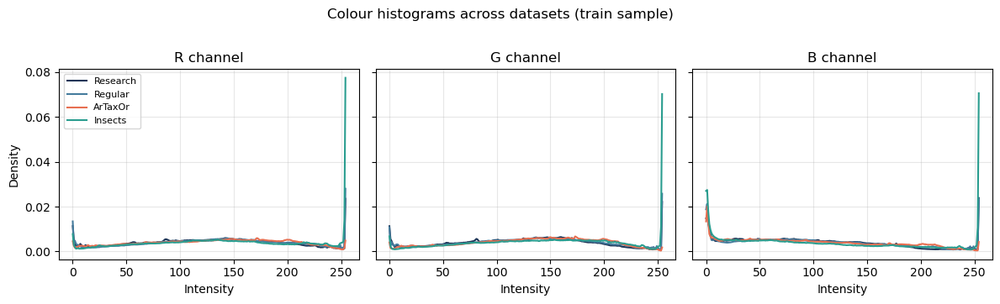

Saved: /home/resulted matrix/dataset_cls_colour_histograms.pdf


In [29]:
# Experiment 3.1 — Colour histogram comparison (4 datasets)
from pathlib import Path
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

DATA_ROOT = Path("dataset_classification/train")  # or "Datasets" unsplitted
N_SAMPLE = 300          # images per dataset
SEED = 42
IMG_SIZE = (128, 128)   # downscale for speed

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
DISPLAY = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rng = random.Random(SEED)
bins = np.arange(0, 256, 1)

hist_rgb = {name: {"R": np.zeros(255), "G": np.zeros(255), "B": np.zeros(255)} for name in DATASET_NAMES}

for name in DATASET_NAMES:
    folder = DATA_ROOT / name
    files = [p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]
    picks = rng.sample(files, min(N_SAMPLE, len(files)))
    print(f"{DISPLAY[name]}: sampling {len(picks)} / {len(files)}")
    for fp in picks:
        try:
            arr = np.asarray(Image.open(fp).convert("RGB").resize(IMG_SIZE), dtype=np.float32)
        except Exception:
            continue
        for i, ch in enumerate("RGB"):
            h, _ = np.histogram(arr[:, :, i], bins=bins, density=False)
            hist_rgb[name][ch] += h
    # normalise to density
    for ch in "RGB":
        s = hist_rgb[name][ch].sum()
        if s > 0:
            hist_rgb[name][ch] /= s

x = bins[:-1]
fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), sharey=True)
colors = {"Research": "#1d3557", "Regular": "#457b9d", "ArTaxOr": "#e76f51", "Insects": "#2a9d8f"}
for ax, ch in zip(axes, "RGB"):
    for name in DATASET_NAMES:
        lab = DISPLAY[name]
        ax.plot(x, hist_rgb[name][ch], label=lab, color=colors[lab], lw=1.5)
    ax.set_title(f"{ch} channel")
    ax.set_xlabel("Intensity")
    ax.grid(True, alpha=0.3)
axes[0].set_ylabel("Density")
axes[0].legend(fontsize=8)
fig.suptitle("Colour histograms across datasets (train sample)", y=1.02)
plt.tight_layout()

out = Path("resulted matrix")
out.mkdir(parents=True, exist_ok=True)
p = out / "dataset_cls_colour_histograms.pdf"
fig.savefig(p, bbox_inches="tight")
plt.show()
print("Saved:", p.resolve())

Research: sampling 300 / 4000
Regular: sampling 300 / 4000
ArTaxOr: sampling 300 / 4000
Insects: sampling 300 / 4000


/home/.conda/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


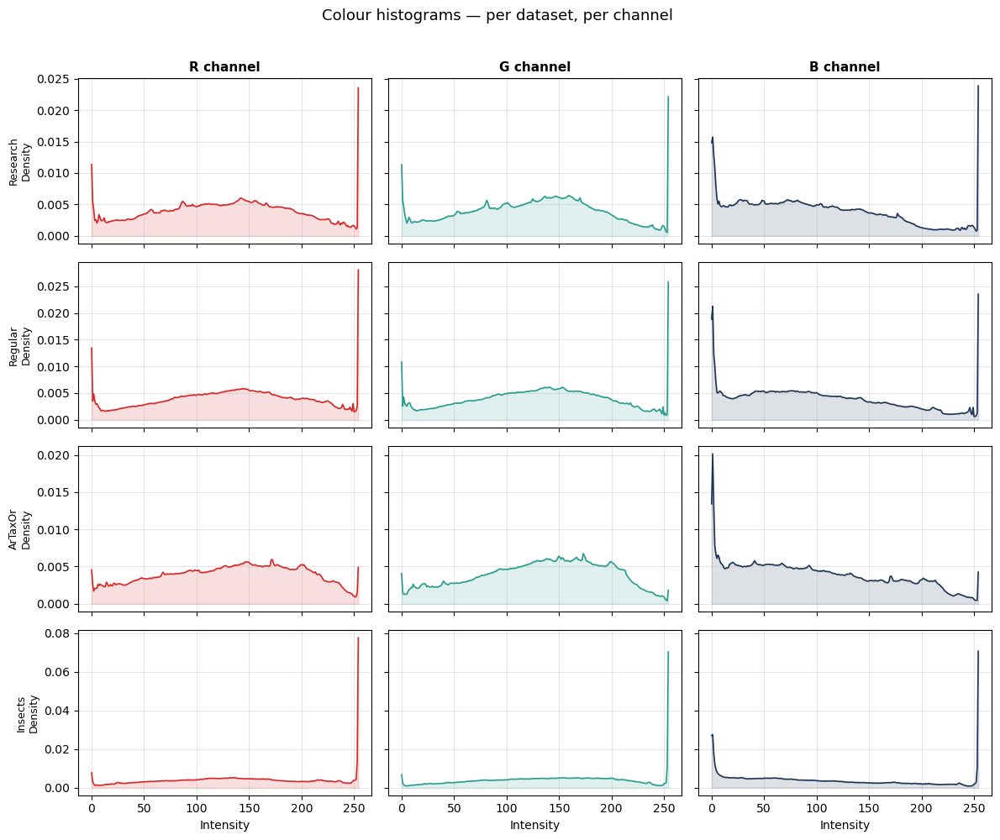

Saved: /home/resulted matrix/dataset_cls_colour_histograms_grid.pdf


In [24]:
# Experiment 3.1 — Colour histogram comparison (4 datasets, gridded)
from pathlib import Path
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

DATA_ROOT = Path("dataset_classification/train")  # or "Datasets"
N_SAMPLE = 300
SEED = 42
IMG_SIZE = (128, 128)

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
DISPLAY = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rng = random.Random(SEED)
bins = np.arange(0, 256, 1)

# channel colours for the lines
CH_COLORS = {"R": "#d62828", "G": "#2a9d8f", "B": "#1d3557"}

hist_rgb = {name: {"R": np.zeros(255), "G": np.zeros(255), "B": np.zeros(255)}
            for name in DATASET_NAMES}

for name in DATASET_NAMES:
    folder = DATA_ROOT / name
    files = [p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]
    picks = rng.sample(files, min(N_SAMPLE, len(files)))
    print(f"{DISPLAY[name]}: sampling {len(picks)} / {len(files)}")
    for fp in picks:
        try:
            arr = np.asarray(Image.open(fp).convert("RGB").resize(IMG_SIZE), dtype=np.float32)
        except Exception:
            continue
        for i, ch in enumerate("RGB"):
            h, _ = np.histogram(arr[:, :, i], bins=bins, density=False)
            hist_rgb[name][ch] += h
    # normalise to density
    for ch in "RGB":
        s = hist_rgb[name][ch].sum()
        if s > 0:
            hist_rgb[name][ch] /= s

x = bins[:-1]

# -------- 4 x 3 grid: rows = datasets, cols = R/G/B --------
fig, axes = plt.subplots(
    len(DATASET_NAMES), 3,
    figsize=(12, 10),
    sharex=True,
    sharey="row",   # share y within a row so channels are comparable
)

for r, name in enumerate(DATASET_NAMES):
    lab = DISPLAY[name]
    for c, ch in enumerate("RGB"):
        ax = axes[r, c]
        ax.plot(x, hist_rgb[name][ch], color=CH_COLORS[ch], lw=1.2)
        ax.fill_between(x, hist_rgb[name][ch], color=CH_COLORS[ch], alpha=0.15)
        ax.grid(True, alpha=0.3)

        # Titles
        if r == 0:
            ax.set_title(f"{ch} channel", fontsize=11, fontweight="bold")
        if c == 0:
            ax.set_ylabel(f"{lab}\nDensity", fontsize=9)
        if r == len(DATASET_NAMES) - 1:
            ax.set_xlabel("Intensity")

fig.suptitle("Colour histograms — per dataset, per channel ",
             y=0.995, fontsize=13)
plt.tight_layout(rect=[0, 0, 1, 0.98])

out = Path("resulted matrix")
out.mkdir(parents=True, exist_ok=True)
p = out / "dataset_cls_colour_histograms_grid.pdf"
fig.savefig(p, bbox_inches="tight")
plt.show()
print("Saved:", p.resolve())

Research: sampling 300 / 4000
Regular: sampling 300 / 4000
ArTaxOr: sampling 300 / 4000
Insects: sampling 300 / 4000


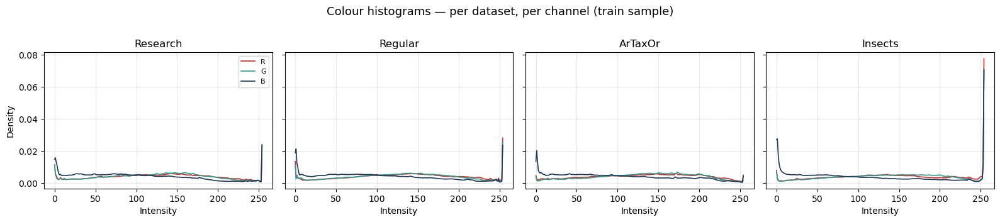

Saved: /home/resulted matrix/dataset_cls_colour_histograms_grid1x4.pdf


In [3]:
# Experiment 3.1 — Colour histogram comparison (4 datasets, gridded)
from pathlib import Path
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

DATA_ROOT = Path("dataset_classification/train")  # or "Datasets"
N_SAMPLE = 300
SEED = 42
IMG_SIZE = (128, 128)

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
DISPLAY = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

rng = random.Random(SEED)
bins = np.arange(0, 256, 1)

# channel colours for the lines
CH_COLORS = {"R": "#d62828", "G": "#2a9d8f", "B": "#1d3557"}

hist_rgb = {name: {"R": np.zeros(255), "G": np.zeros(255), "B": np.zeros(255)}
            for name in DATASET_NAMES}

for name in DATASET_NAMES:
    folder = DATA_ROOT / name
    files = [p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]
    picks = rng.sample(files, min(N_SAMPLE, len(files)))
    print(f"{DISPLAY[name]}: sampling {len(picks)} / {len(files)}")
    for fp in picks:
        try:
            arr = np.asarray(Image.open(fp).convert("RGB").resize(IMG_SIZE), dtype=np.float32)
        except Exception:
            continue
        for i, ch in enumerate("RGB"):
            h, _ = np.histogram(arr[:, :, i], bins=bins, density=False)
            hist_rgb[name][ch] += h
    # normalise to density
    for ch in "RGB":
        s = hist_rgb[name][ch].sum()
        if s > 0:
            hist_rgb[name][ch] /= s

x = bins[:-1]
fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), sharey=True)
for ax, name in zip(axes, DATASET_NAMES):
    for ch in "RGB":
        ax.plot(x, hist_rgb[name][ch], color=CH_COLORS[ch], lw=1.2, label=ch)
    ax.set_title(DISPLAY[name])
    ax.set_xlabel("Intensity")
    ax.grid(True, alpha=0.3)
axes[0].set_ylabel("Density")
axes[0].legend(fontsize=8)
fig.suptitle("Per-dataset RGB histograms", y=1.02)
plt.tight_layout()




fig.suptitle("Colour histograms — per dataset, per channel (train sample)",
             y=0.995, fontsize=13)
plt.tight_layout(rect=[0, 0, 1, 0.98])

out = Path("resulted matrix")
out.mkdir(parents=True, exist_ok=True)
p = out / "dataset_cls_colour_histograms_grid1x4.pdf"
fig.savefig(p, bbox_inches="tight")
plt.show()
print("Saved:", p.resolve())

In [30]:
# once per environment
%pip install -q grad-cam

Note: you may need to restart the kernel to use updated packages.


Classes: ['ArTaxOr', 'Insects_Image_Dataset', 'iNaturalist_Regular_Data', 'iNaturalist_Research_Data']
CKPT: checkpoints_dataset_cls_4way_f2/dscls-f2-epoch=02-val_loss=0.7910.ckpt


/home/.conda/envs/myenv/lib/python3.10/site-packages/lightning_fabric/utilities/cloud_io.py:73: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


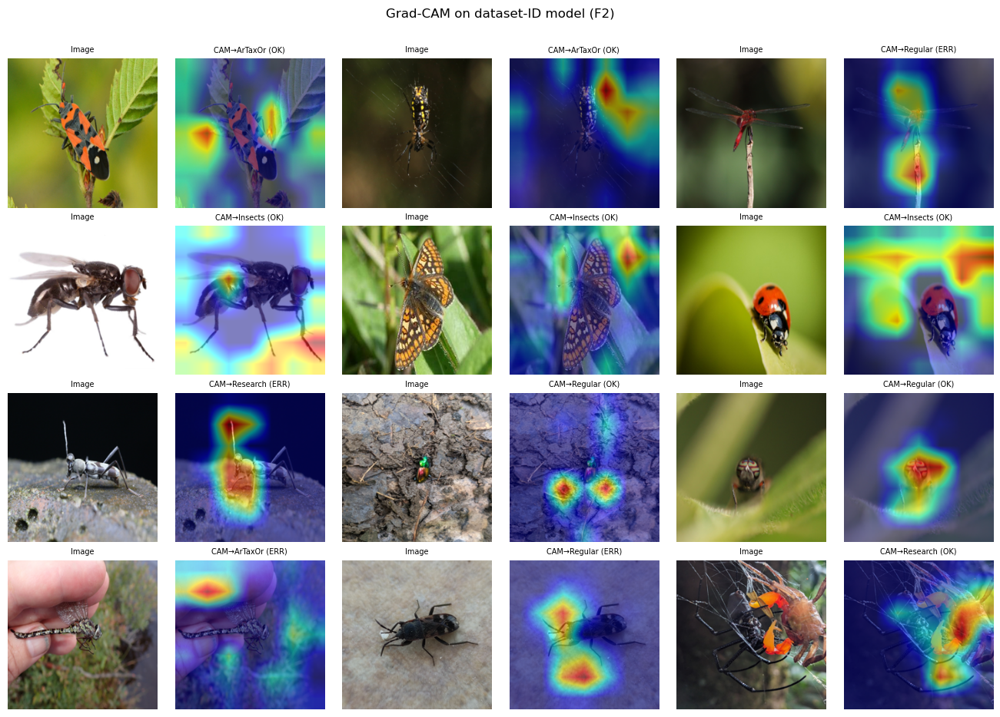

Saved: /home/resulted matrix/dataset_cls_gradcam_f2.pdf


In [2]:
# Experiment 3.2 — Grad-CAM (self-contained; no need for prior cfg in memory)
from pathlib import Path
from dataclasses import dataclass, field
from typing import List
import random
import numpy as np
import torch
import torch.nn as nn
import torchvision
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
import pytorch_lightning as pl
from torchmetrics.classification import MulticlassAccuracy

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
FIG_DIR = Path("resulted matrix")
FIG_DIR.mkdir(parents=True, exist_ok=True)

@dataclass
class Config:
    class_names: List[str] = field(default_factory=lambda: [
        "ArTaxOr",
        "Insects_Image_Dataset",
        "iNaturalist_Regular_Data",
        "iNaturalist_Research_Data",
    ])
    lr: float = 1e-5
    weight_decay: float = 3e-3
    dropout_p: float = 0.5
    label_smoothing: float = 0.0

    @property
    def num_classes(self) -> int:
        return len(self.class_names)

class DatasetClassifierConvNeXt(pl.LightningModule):
    def __init__(self, cfg: Config):
        super().__init__()
        self.cfg = cfg
        self.save_hyperparameters(ignore=["cfg"])
        weights = torchvision.models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = torchvision.models.convnext_tiny(weights=weights)
        in_features = self.backbone.classifier[2].in_features
        self.backbone.classifier = nn.Sequential(
            self.backbone.classifier[0],
            self.backbone.classifier[1],
            nn.Dropout(p=cfg.dropout_p),
            nn.Linear(in_features, cfg.num_classes),
        )
        self.criterion = nn.CrossEntropyLoss(label_smoothing=cfg.label_smoothing)
        self.train_acc = MulticlassAccuracy(num_classes=cfg.num_classes)
        self.val_acc = MulticlassAccuracy(num_classes=cfg.num_classes)
        self.test_acc = MulticlassAccuracy(num_classes=cfg.num_classes)

    def forward(self, x):
        return self.backbone(x)

cfg_load = Config()
# ImageFolder alphabetical order — must match training
print("Classes:", cfg_load.class_names)

cands = list(Path("checkpoints_dataset_cls_4way_f2").glob("*-val_loss=*.ckpt"))
assert cands, "No F2 checkpoints found"
BEST_CKPT_F2 = str(min(cands, key=lambda p: float(p.stem.split("val_loss=")[-1])))
print("CKPT:", BEST_CKPT_F2)

model = DatasetClassifierConvNeXt.load_from_checkpoint(
    BEST_CKPT_F2, cfg=cfg_load, strict=False
).to(DEVICE).eval()

target_layers = [model.backbone.features[-1]]

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD = np.array([0.229, 0.224, 0.225])
tfm = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN.tolist(), IMAGENET_STD.tolist()),
])

short = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
class_names = list(cfg_load.class_names)
DISP = [short.get(c, c) for c in class_names]

TEST_ROOT = Path("dataset_classification/test")
N_PER_CLASS = 3
SEED = 42
rng = random.Random(SEED)
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

cam = GradCAM(model=model, target_layers=target_layers)

fig, axes = plt.subplots(
    len(class_names), N_PER_CLASS * 2,
    figsize=(2.2 * N_PER_CLASS * 2, 2.3 * len(class_names)),
)

for i, cname in enumerate(class_names):
    folder = TEST_ROOT / cname
    files = [p for p in folder.iterdir() if p.suffix.lower() in IMG_EXTS]
    picks = rng.sample(files, min(N_PER_CLASS, len(files)))

    for j, fp in enumerate(picks):
        pil = Image.open(fp).convert("RGB").resize((224, 224))
        rgb = np.asarray(pil).astype(np.float32) / 255.0
        inp = tfm(pil).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            pred = int(model(inp).argmax(1).item())

        grayscale_cam = cam(input_tensor=inp, targets=[ClassifierOutputTarget(pred)])[0]
        overlay = show_cam_on_image(rgb, grayscale_cam, use_rgb=True)

        ax0, ax1 = axes[i, 2 * j], axes[i, 2 * j + 1]
        ax0.imshow(rgb); ax1.imshow(overlay)
        ax0.axis("off"); ax1.axis("off")
        true_s, pred_s = DISP[i], DISP[pred]
        ok = "OK" if pred == i else "ERR"
        if j == 0:
            ax0.set_ylabel(true_s, fontsize=9, fontweight="bold", rotation=0,
                           labelpad=40, va="center", ha="right")
        ax0.set_title("Image", fontsize=7)
        ax1.set_title(f"CAM→{pred_s} ({ok})", fontsize=7)

fig.suptitle("Grad-CAM on dataset-ID model (F2)", y=1.01)
plt.tight_layout()
p = FIG_DIR / "dataset_cls_gradcam_f2.pdf"
fig.savefig(p, bbox_inches="tight")
plt.show()
print("Saved:", p.resolve())

del cam
torch.cuda.empty_cache()

In [3]:
# ============================================================
# 4-way dataset cue analysis: colour histograms + Grad-CAM (F2)
# ============================================================
from pathlib import Path
from dataclasses import dataclass, field
from typing import List
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import pytorch_lightning as pl
from torchmetrics.classification import MulticlassAccuracy

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
FIG_DIR = Path("resulted matrix")
FIG_DIR.mkdir(parents=True, exist_ok=True)
SEED = 42

DATASET_NAMES = [
    "iNaturalist_Research_Data",
    "iNaturalist_Regular_Data",
    "ArTaxOr",
    "Insects_Image_Dataset",
]
DISPLAY = {
    "iNaturalist_Research_Data": "Research",
    "iNaturalist_Regular_Data": "Regular",
    "ArTaxOr": "ArTaxOr",
    "Insects_Image_Dataset": "Insects",
}
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

Research: 300 / 4000
Regular: 300 / 4000
ArTaxOr: 300 / 4000
Insects: 300 / 4000


/home/.conda/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


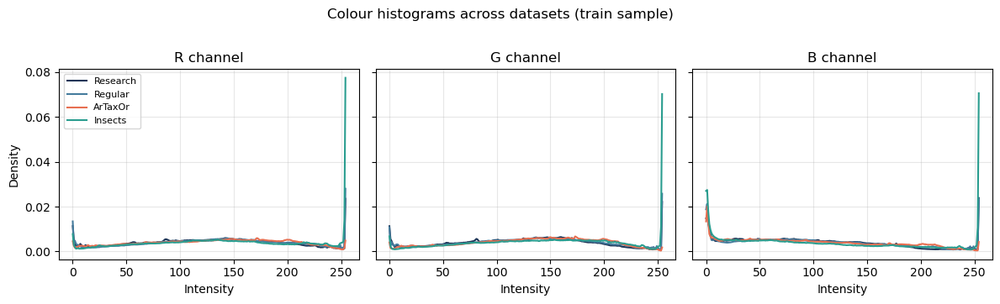

Saved: /home/resulted matrix/dataset_cls_colour_histograms.pdf


In [4]:
# ---------- 1) Colour histograms ----------
DATA_ROOT = Path("dataset_classification/train")
N_SAMPLE = 300
IMG_SIZE = (128, 128)
rng = random.Random(SEED)
bins = np.arange(0, 256, 1)

hist_rgb = {name: {"R": np.zeros(255), "G": np.zeros(255), "B": np.zeros(255)}
            for name in DATASET_NAMES}

for name in DATASET_NAMES:
    folder = DATA_ROOT / name
    files = [p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]
    picks = rng.sample(files, min(N_SAMPLE, len(files)))
    print(f"{DISPLAY[name]}: {len(picks)} / {len(files)}")
    for fp in picks:
        try:
            arr = np.asarray(Image.open(fp).convert("RGB").resize(IMG_SIZE), dtype=np.float32)
        except Exception:
            continue
        for i, ch in enumerate("RGB"):
            h, _ = np.histogram(arr[:, :, i], bins=bins, density=False)
            hist_rgb[name][ch] += h
    for ch in "RGB":
        s = hist_rgb[name][ch].sum()
        if s > 0:
            hist_rgb[name][ch] /= s

x = bins[:-1]
fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), sharey=True)
colors = {"Research": "#1d3557", "Regular": "#457b9d", "ArTaxOr": "#e76f51", "Insects": "#2a9d8f"}
for ax, ch in zip(axes, "RGB"):
    for name in DATASET_NAMES:
        lab = DISPLAY[name]
        ax.plot(x, hist_rgb[name][ch], label=lab, color=colors[lab], lw=1.5)
    ax.set_title(f"{ch} channel")
    ax.set_xlabel("Intensity")
    ax.grid(True, alpha=0.3)
axes[0].set_ylabel("Density")
axes[0].legend(fontsize=8)
fig.suptitle("Colour histograms across datasets (train sample)", y=1.02)
plt.tight_layout()
p_hist = FIG_DIR / "dataset_cls_colour_histograms.pdf"
fig.savefig(p_hist, bbox_inches="tight")
plt.show()
print("Saved:", p_hist.resolve())

CKPT: checkpoints_dataset_cls_4way_f2/dscls-f2-epoch=02-val_loss=0.7910.ckpt


/home/.conda/envs/myenv/lib/python3.10/site-packages/lightning_fabric/utilities/cloud_io.py:73: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


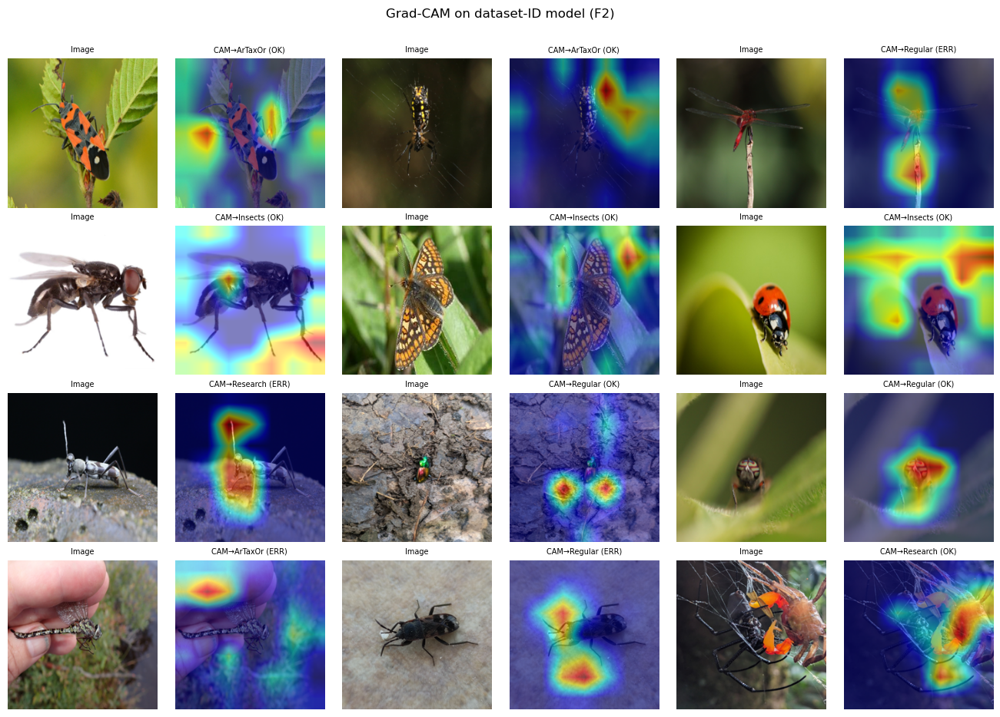

Saved: /home/resulted matrix/dataset_cls_gradcam_f2.pdf


In [5]:
# ---------- 2) Grad-CAM (install once if needed) ----------
# %pip install -q grad-cam

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

@dataclass
class Config:
    class_names: List[str] = field(default_factory=lambda: [
        "ArTaxOr",
        "Insects_Image_Dataset",
        "iNaturalist_Regular_Data",
        "iNaturalist_Research_Data",
    ])  # ImageFolder alphabetical order
    lr: float = 1e-5
    weight_decay: float = 3e-3
    dropout_p: float = 0.5
    label_smoothing: float = 0.0

    @property
    def num_classes(self) -> int:
        return len(self.class_names)

class DatasetClassifierConvNeXt(pl.LightningModule):
    def __init__(self, cfg: Config):
        super().__init__()
        self.cfg = cfg
        self.save_hyperparameters(ignore=["cfg"])
        weights = torchvision.models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = torchvision.models.convnext_tiny(weights=weights)
        in_features = self.backbone.classifier[2].in_features
        self.backbone.classifier = nn.Sequential(
            self.backbone.classifier[0],
            self.backbone.classifier[1],
            nn.Dropout(p=cfg.dropout_p),
            nn.Linear(in_features, cfg.num_classes),
        )
        self.criterion = nn.CrossEntropyLoss(label_smoothing=cfg.label_smoothing)
        self.train_acc = MulticlassAccuracy(num_classes=cfg.num_classes)
        self.val_acc = MulticlassAccuracy(num_classes=cfg.num_classes)
        self.test_acc = MulticlassAccuracy(num_classes=cfg.num_classes)

    def forward(self, x):
        return self.backbone(x)

cfg_load = Config()
cands = list(Path("checkpoints_dataset_cls_4way_f2").glob("*-val_loss=*.ckpt"))
assert cands, "No F2 checkpoints in checkpoints_dataset_cls_4way_f2/"
BEST_CKPT_F2 = str(min(cands, key=lambda p: float(p.stem.split("val_loss=")[-1])))
print("CKPT:", BEST_CKPT_F2)

model = DatasetClassifierConvNeXt.load_from_checkpoint(
    BEST_CKPT_F2, cfg=cfg_load, strict=False
).to(DEVICE).eval()

target_layers = [model.backbone.features[-1]]
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD = np.array([0.229, 0.224, 0.225])
tfm = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN.tolist(), IMAGENET_STD.tolist()),
])

class_names = list(cfg_load.class_names)
DISP = [DISPLAY.get(c, c) for c in class_names]
TEST_ROOT = Path("dataset_classification/test")
N_PER_CLASS = 3
rng = random.Random(SEED)

cam = GradCAM(model=model, target_layers=target_layers)
fig, axes = plt.subplots(
    len(class_names), N_PER_CLASS * 2,
    figsize=(2.2 * N_PER_CLASS * 2, 2.3 * len(class_names)),
)

for i, cname in enumerate(class_names):
    folder = TEST_ROOT / cname
    files = [p for p in folder.iterdir() if p.suffix.lower() in IMG_EXTS]
    picks = rng.sample(files, min(N_PER_CLASS, len(files)))
    for j, fp in enumerate(picks):
        pil = Image.open(fp).convert("RGB").resize((224, 224))
        rgb = np.asarray(pil).astype(np.float32) / 255.0
        inp = tfm(pil).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            pred = int(model(inp).argmax(1).item())
        grayscale_cam = cam(input_tensor=inp, targets=[ClassifierOutputTarget(pred)])[0]
        overlay = show_cam_on_image(rgb, grayscale_cam, use_rgb=True)

        ax0, ax1 = axes[i, 2 * j], axes[i, 2 * j + 1]
        ax0.imshow(rgb); ax1.imshow(overlay)
        ax0.axis("off"); ax1.axis("off")
        ok = "OK" if pred == i else "ERR"
        if j == 0:
            ax0.set_ylabel(DISP[i], fontsize=9, fontweight="bold", rotation=0,
                           labelpad=40, va="center", ha="right")
        ax0.set_title("Image", fontsize=7)
        ax1.set_title(f"CAM→{DISP[pred]} ({ok})", fontsize=7)

fig.suptitle("Grad-CAM on dataset-ID model (F2)", y=1.01)
plt.tight_layout()
p_cam = FIG_DIR / "dataset_cls_gradcam_f2.pdf"
fig.savefig(p_cam, bbox_inches="tight")
plt.show()
print("Saved:", p_cam.resolve())

del cam
torch.cuda.empty_cache()

In [7]:

import torch
torch.cuda.device_count()

1

In [10]:
torch.cuda.get_device_name()

'NVIDIA GeForce GTX TITAN X'

In [14]:
torch.cuda.device(0)

In [15]:
import numpy as np
arr= np.array([[1,2,3],[3,5,4]])

arr

array([[1, 2, 3],
       [3, 5, 4]])

In [16]:
tensor = torch.Tensor([[1,2,3],[3,5,4]])

tensor

tensor([[1., 2., 3.],
        [3., 5., 4.]])

In [17]:
arr*5


array([[ 5, 10, 15],
       [15, 25, 20]])

In [18]:
tensor*5

tensor([[ 5., 10., 15.],
        [15., 25., 20.]])

In [19]:
arr.sum()

18

In [20]:
tensor.sum()

tensor(18.)

In [21]:
tensor = torch.from_numpy(arr)

In [22]:
tensor

tensor([[1, 2, 3],
        [3, 5, 4]])